In [1]:
import pandas as pd
import numpy as np
import re
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer
import seaborn as sns
from sklearn.linear_model import LassoCV
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LassoCV, RidgeCV
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, ExtraTreesRegressor
from sklearn.svm import SVR
from sklearn.linear_model import ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor


In [2]:
import warnings
warnings.filterwarnings('once')

In [3]:
pct_df = pd.read_csv('data/Full_Dataset_PCT.csv')
prf_df = pd.read_csv('data/Full_Dataset_PRF.csv')

In [ ]:
import pandas as pd
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant

# Assuming `pct_df` is your DataFrame

# Define the columns to be dropped, including 'Formatted_District' and 'GEOID'
cols_to_drop = ['Formatted_District', 'GEOID', 'Representative', 'PVI_2023', 'Rep', 'Status', 'Dem Votes', 
                'Rep Votes', 'Other Votes', 'Dem %', 'Rep %', 'Other %', '2022 Margin', 
                'Swing from 2020 presidential', 'Percent of 2020 turnout', '2022 State PVI', 
                '2020 Biden %', '2020 Trump %', '2016 Clinton %', '2016 Trump %', 
                'National 2020 Pres Popular %', 'National 2022 House Popular %', 
                '2020 State Diff', '2016 State Diff']

# Remove the specified columns for multicollinearity diagnostics
X = pct_df.drop(columns=cols_to_drop)

# Ensure that all remaining columns are numeric for correlation and VIF
# If there are any non-numeric columns, you'll need to handle them appropriately
# For now, we'll just select numeric columns
X_numeric = X.select_dtypes(include=[np.number])

# Calculate the correlation matrix for numeric features only
correlation_matrix = X_numeric.corr()
print("Correlation Matrix:")
print(correlation_matrix)

# Add a constant column for the intercept for VIF calculation
X_numeric_with_constant = add_constant(X_numeric)

# Prepare DataFrame for VIF results
vif_data = pd.DataFrame()
vif_data["Feature"] = X_numeric_with_constant.columns

# Calculate VIF for each feature, skipping the added constant column
vif_data["VIF"] = [variance_inflation_factor(X_numeric_with_constant.values, i) 
                   for i in range(1, X_numeric_with_constant.shape[1])]

print("\nVIF Scores:")
print(vif_data)


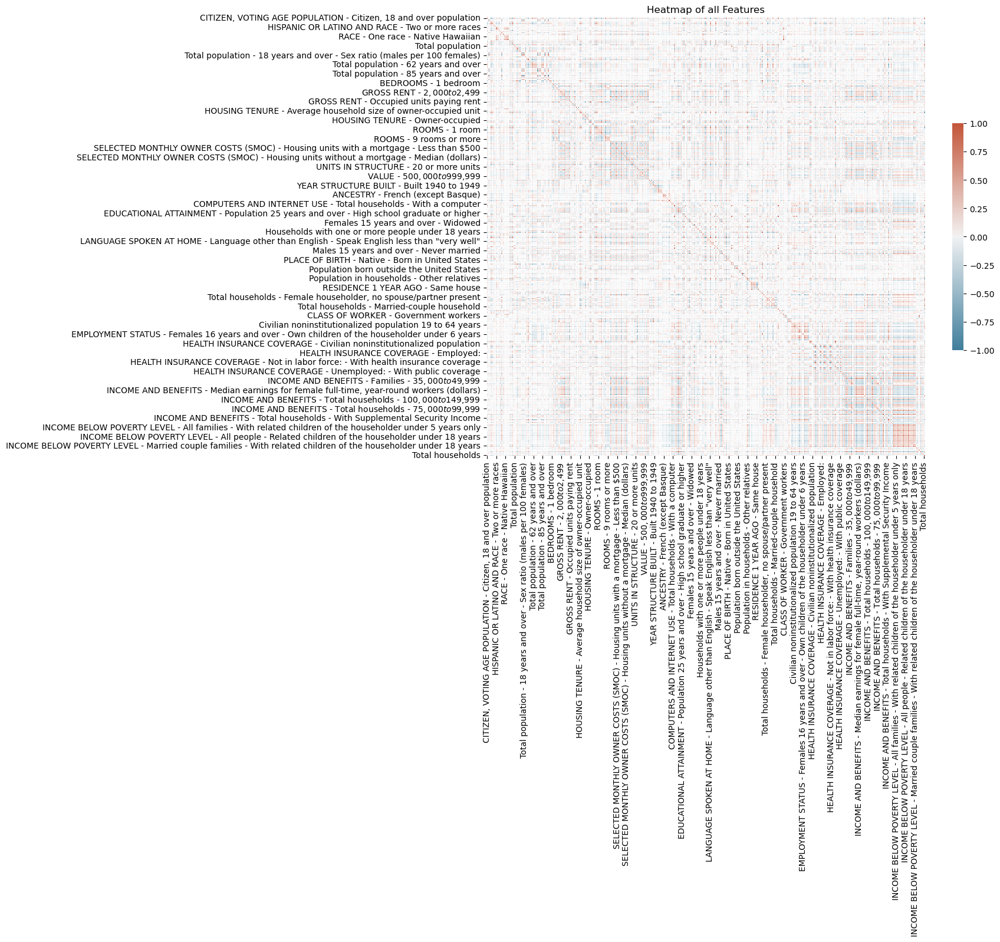

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Columns to drop, including district names and other target features
cols_to_drop = ['Formatted_District', 'GEOID', 'Representative', 'PVI_2023', 'Rep', 'Status', 'Dem Votes', 
                'Rep Votes', 'Other Votes', 'Dem %', 'Rep %', 'Other %', '2022 Margin', 
                'Swing from 2020 presidential', 'Percent of 2020 turnout', '2022 State PVI', 
                '2020 Biden %', '2020 Trump %', '2016 Clinton %', '2016 Trump %', 
                'National 2020 Pres Popular %', 'National 2022 House Popular %', 
                '2020 State Diff', '2016 State Diff']

# Drop specified columns and select only numeric columns for correlation matrix
numeric_df = pct_df.drop(columns=cols_to_drop).select_dtypes(include=[np.number])

# Compute the full correlation matrix for numeric columns only
correlation_matrix = numeric_df.corr()

# Create a mask to identify rows/columns that should be kept
threshold = 0.75
mask = np.abs(correlation_matrix) > threshold
np.fill_diagonal(mask.values, False)  # Exclude the diagonal to ignore self-correlations
rows_cols_to_keep = mask.any(axis=1)  # Identify rows with any value exceeding the threshold

# Apply the mask to filter the correlation matrix
filtered_corr_matrix = correlation_matrix.loc[rows_cols_to_keep, rows_cols_to_keep]

# Plot the filtered correlation matrix as a heatmap
plt.figure(figsize=(12, 10))  # Adjust the size as needed
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(filtered_corr_matrix, cmap=cmap, vmax=1, vmin=-1, center=0,
            square=True, annot=False, linewidths=.5, cbar_kws={"shrink": .5})

plt.title("Heatmap of all Features")
plt.show()


The upper_tri portion of the code is used to select only the upper triangle of the correlation matrix, excluding the diagonal. This is a common practice when dealing with correlation matrices because they are symmetric, meaning the lower triangle is a mirror image of the upper triangle, and the diagonal always consists of 1s (since every variable is perfectly correlated with itself).

Here's a breakdown of what's happening:

corr_matrix = df.corr().abs(): This line computes the correlation matrix for the DataFrame df and takes the absolute value of each correlation coefficient. The absolute value is used because we're often interested in the strength of the correlation regardless of its direction (positive or negative).

np.triu(np.ones(corr_matrix.shape), k=1).astype(bool): This line creates a boolean mask for the upper triangle of the correlation matrix.

np.ones(corr_matrix.shape) creates a matrix of ones with the same shape as the correlation matrix.
np.triu(..., k=1) converts all elements below the first diagonal (k=1) to zeros, leaving the upper triangle (including the diagonal) as ones. The k=1 parameter effectively excludes the diagonal by starting one above it.
.astype(bool) converts the resulting matrix to boolean type, where ones become True and zeros become False.
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool)): This line applies the boolean mask to the correlation matrix, effectively zeroing out the lower triangle and the diagonal. As a result, upper_tri only includes the upper triangle of the correlation matrix (excluding the diagonal), represented by actual correlation values, with the rest being NaN.

The upper_tri matrix is then used to find columns that have any correlation value above a specified threshold (threshold = 0.75 in the example). This is done by (upper_tri > threshold).any(axis=1), which checks each row for any True values (correlations above the threshold), resulting in a boolean series indicating which rows (and corresponding columns) should be kept.

By focusing on the upper triangle, the code avoids redundant calculations and comparisons (since the lower triangle contains the same information as the upper triangle) and ensures that no variable is considered to be highly correlated with itself (which would always be the case along the diagonal where the correlation is 1).

User
put it still spits out a symmetrical full square image

Save & Submit

Cancel
ChatGPT
Yes, that's correct. Even though the upper_tri mask is used to filter out rows and columns based on the threshold, resulting in a reduced set of features that have at least one strong correlation with another feature, the final heatmap still displays a symmetric matrix. This is because the sns.heatmap() function plots the correlation matrix (filtered_corr_matrix), which is inherently symmetric, showing the correlation of each feature with every other feature, including itself (diagonal).

The upper_tri mask helps in identifying which features (rows/columns) to keep based on the threshold but doesn't directly influence the symmetry of the heatmap. The heatmap always visualizes the full correlation matrix for the selected features, which includes both the upper and lower triangles and the diagonal (where each feature is perfectly correlated with itself).

If the goal is to visualize only the upper triangle in the heatmap to avoid redundancy, you can create a mask for the lower triangle (including the diagonal) and apply it when plotting the heatmap:

Saved heatmap to heatmap_of_highly_correlated_features.png


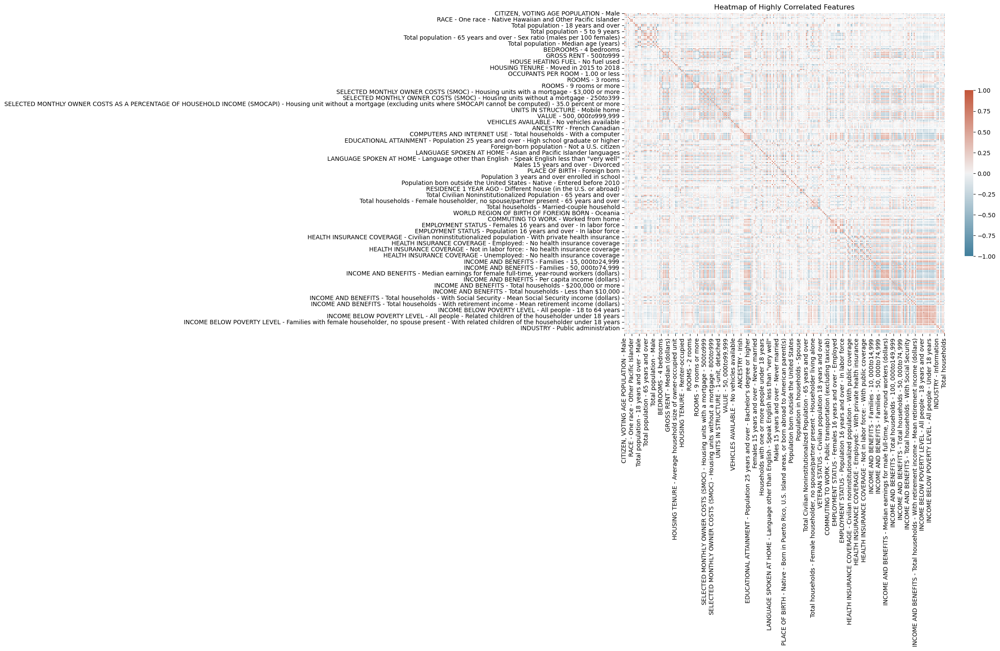

In [6]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Drop non-numeric columns
numeric_df = pct_df.drop(columns=cols_to_drop).select_dtypes(include=[np.number])

# Function to find highly correlated pairs
def find_highly_correlated_pairs(df, threshold=0.75):
    corr_matrix = df.corr().abs()  # Absolute value to consider both positive and negative correlations
    upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    
    # Find index and columns names for pairs exceeding the threshold
    to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > threshold)]
    return df[to_drop]

# Use the function to find highly correlated pairs
high_corr_df = find_highly_correlated_pairs(numeric_df)

# Compute the correlation matrix only for the filtered dataframe
filtered_corr_matrix = high_corr_df.corr()

# Plotting
plt.figure(figsize=(12, 10))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(filtered_corr_matrix, cmap=cmap, vmax=1, vmin=-1, center=0, square=True, annot=False, linewidths=.5, cbar_kws={"shrink": .5})

heatmap_title = "Heatmap of Highly Correlated Features"
plt.title(heatmap_title)

# Save the figure
file_name = heatmap_title.replace(" ", "_").lower() + ".png"
plt.savefig(file_name, bbox_inches='tight', dpi=300)
print(f"Saved heatmap to {file_name}")

plt.show()


Saved heatmap to demographics_heatmap.png


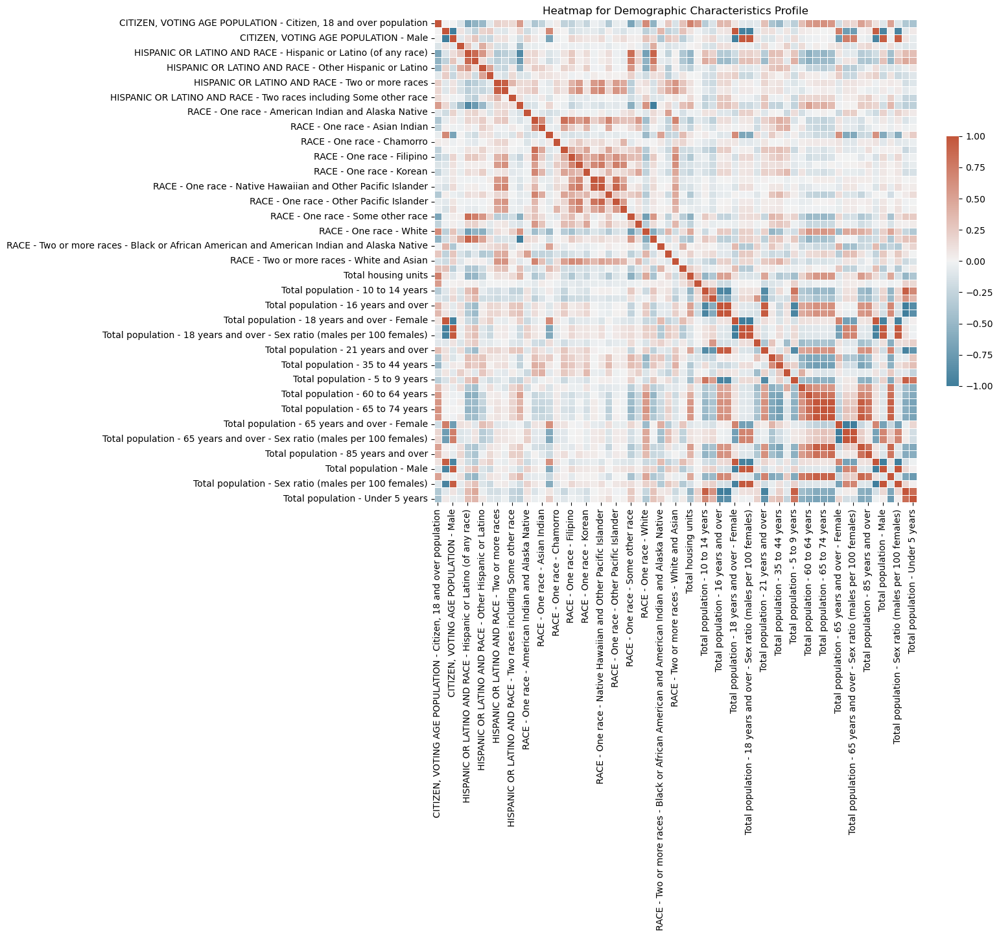

Saved heatmap to housing_heatmap.png


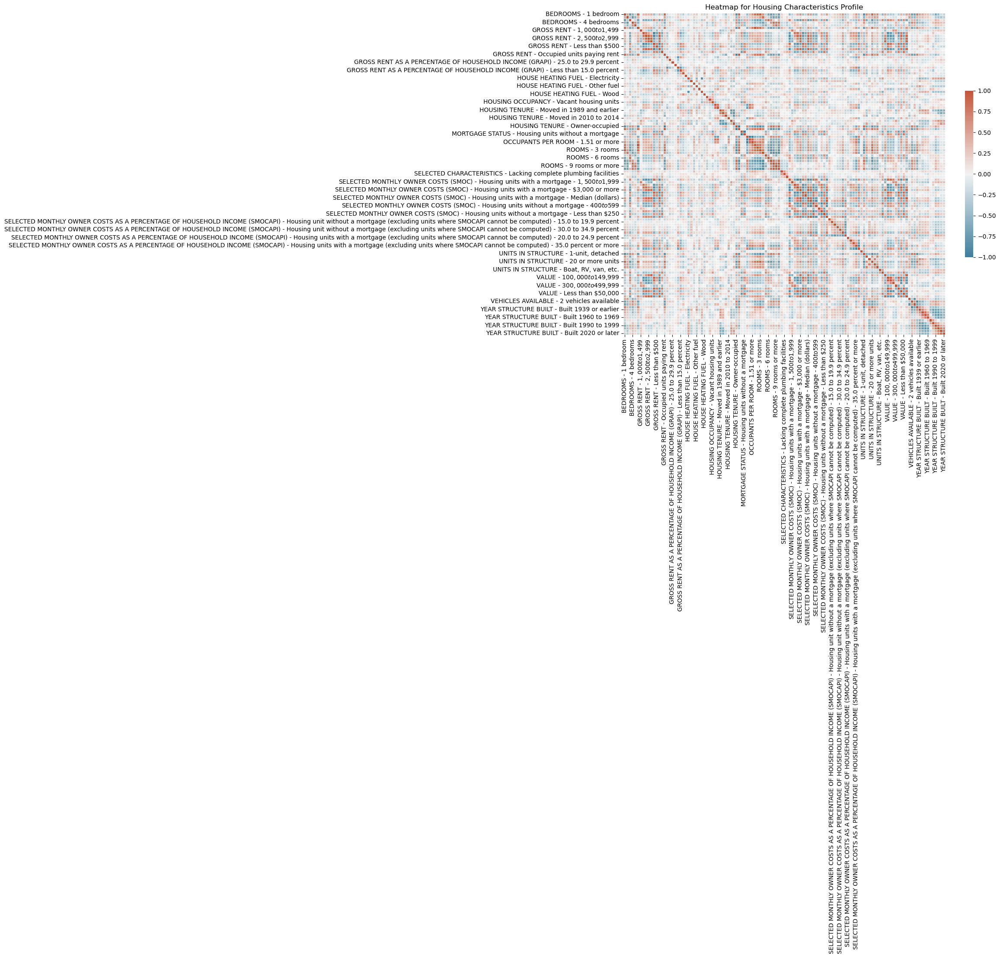

Saved heatmap to social_heatmap.png


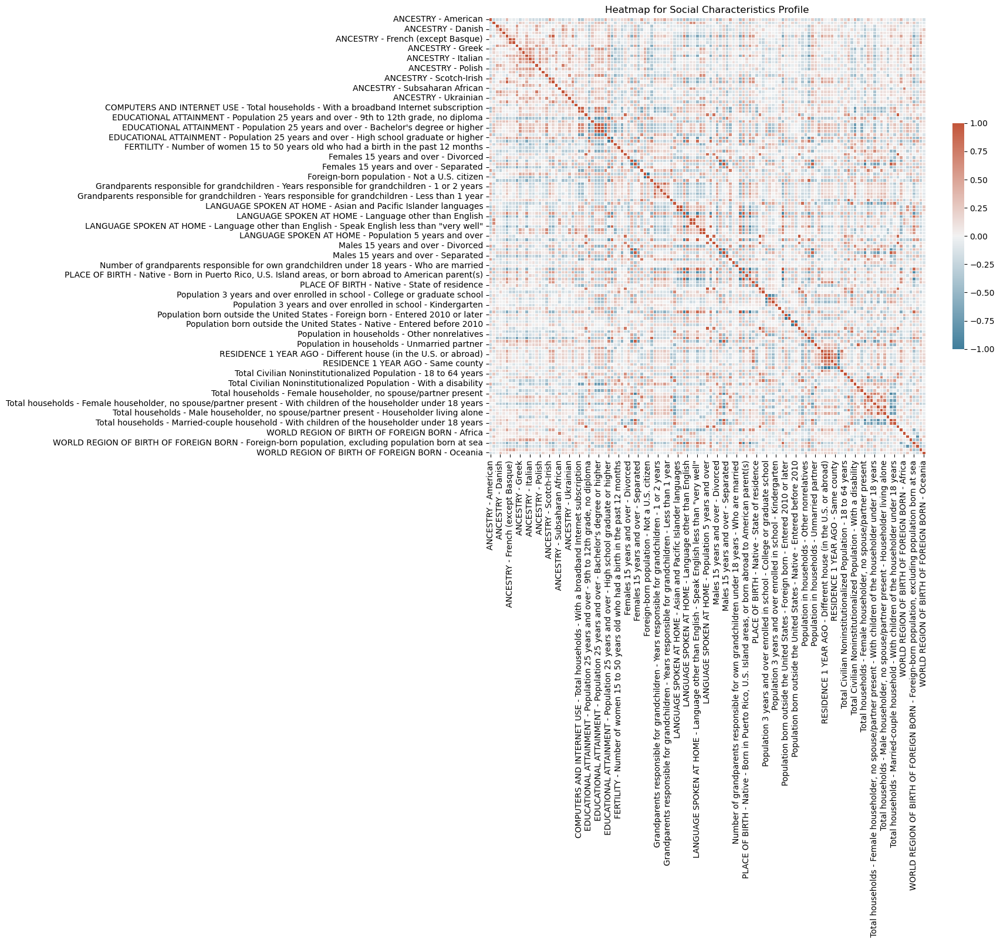

Saved heatmap to economics_heatmap.png


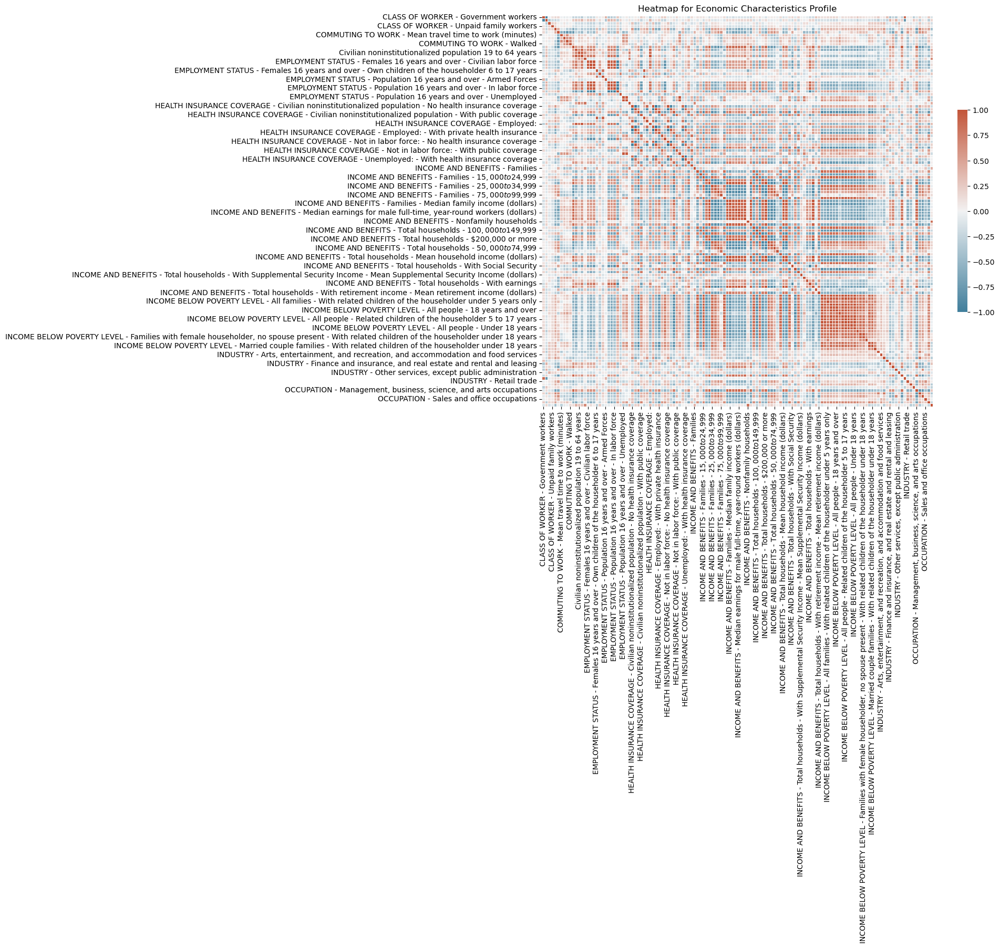

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

# Column names defining the start and end of each section
demographics_range = ('CITIZEN, VOTING AGE POPULATION - Citizen, 18 and over population', 'Total population - Under 5 years')
housing_range = ('BEDROOMS - 1 bedroom', 'YEAR STRUCTURE BUILT - Built 2020 or later')
social_range = ('ANCESTRY - American', 'WORLD REGION OF BIRTH OF FOREIGN BORN - Oceania')
economics_range = ('CLASS OF WORKER - Government workers', 'Total households')

# Adjusted function to include profile_name parameter
def plot_section_heatmap(df, start_col, end_col, profile_name, threshold=0.75, file_name=None):
    # Extract columns between start_col and end_col, inclusive
    section_cols = df.loc[:, start_col:end_col].columns
    # Compute the correlation matrix for the selected columns
    section_corr_matrix = df[section_cols].corr()

    # Set up the matplotlib figure
    plt.figure(figsize=(12, 10))  # Adjust the size if needed

    # Generate a colormap for the heatmap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio
    sns.heatmap(section_corr_matrix, cmap=cmap, vmax=1, vmin=-1, center=0,
                square=True, annot=False, linewidths=.5, cbar_kws={"shrink": .5})  # annot set to False for clarity

    # Use profile_name in the title
    plt.title(f"Heatmap for {profile_name} Characteristics Profile")

    # Save the figure to a file if a file name is provided
    if file_name:
        plt.savefig(file_name, bbox_inches='tight', dpi=300)  # Adjust DPI as needed
        print(f"Saved heatmap to {file_name}")

    plt.show()

# Plot and save heatmaps for each section using the adjusted function
plot_section_heatmap(pct_df, *demographics_range, profile_name='Demographic', file_name='demographics_heatmap.png')
plot_section_heatmap(pct_df, *housing_range, profile_name='Housing', file_name='housing_heatmap.png')
plot_section_heatmap(pct_df, *social_range, profile_name='Social', file_name='social_heatmap.png')
plot_section_heatmap(pct_df, *economics_range, profile_name='Economic', file_name='economics_heatmap.png')


Saved heatmap to demographics_heatmap_highly_correlated.png


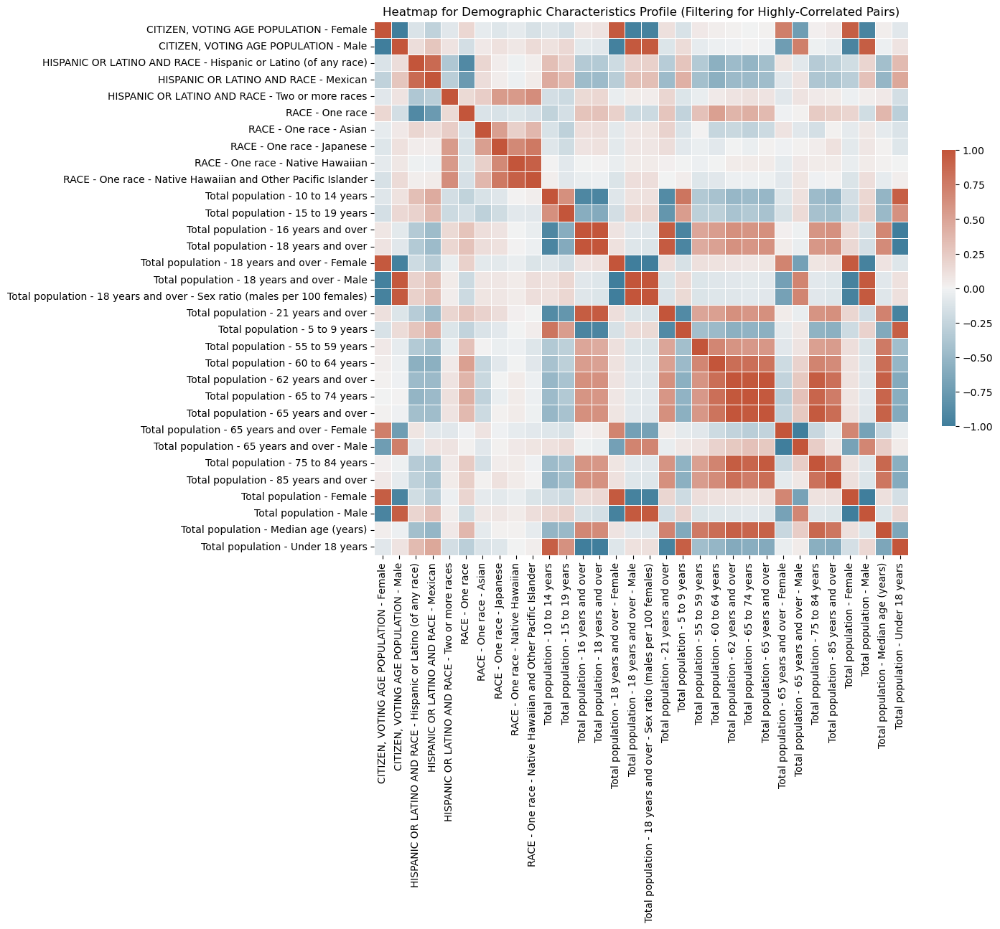

Saved heatmap to housing_heatmap_highly_correlated.png


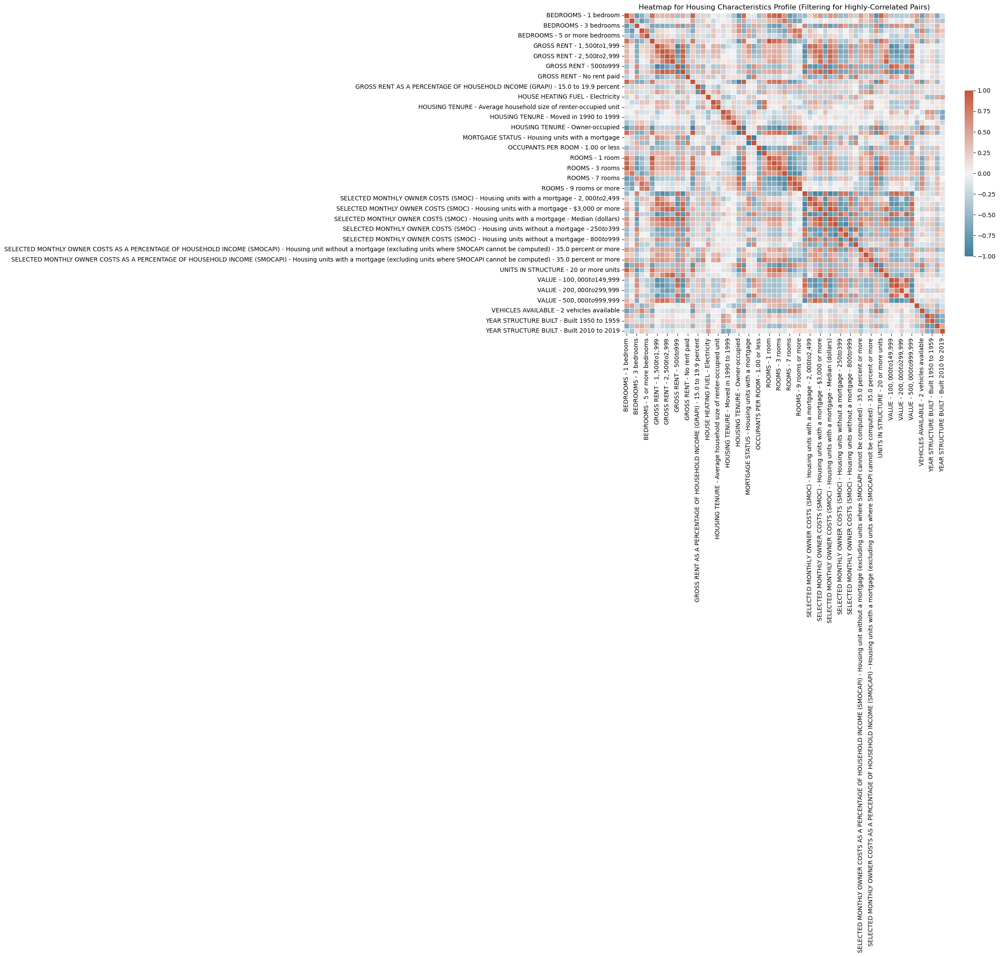

Saved heatmap to social_heatmap_highly_correlated.png


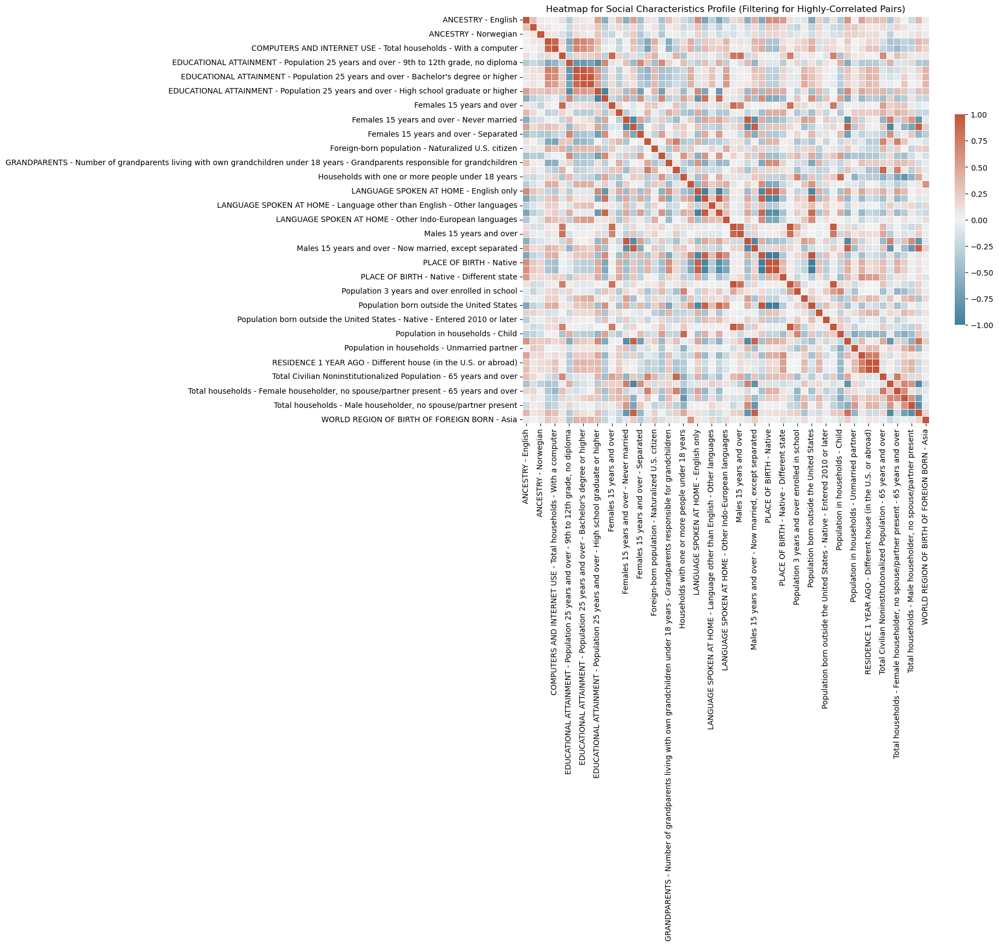

Saved heatmap to economics_heatmap_highly_correlated.png


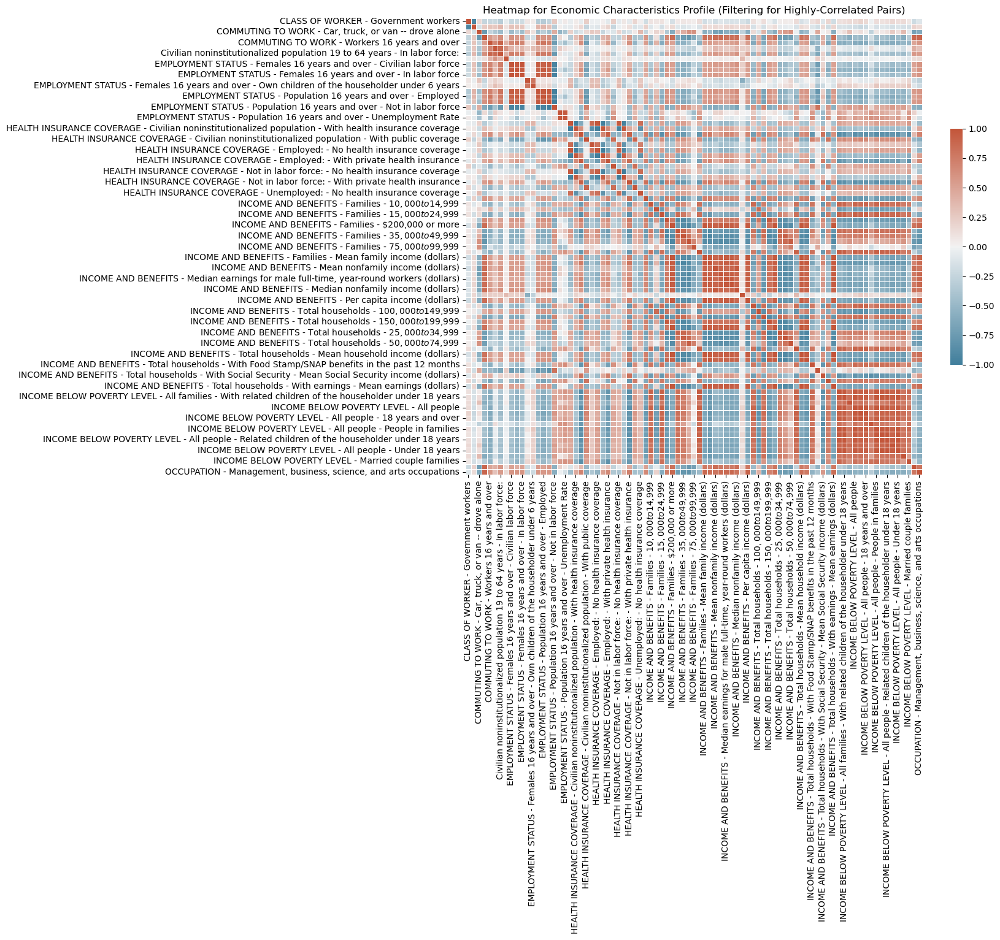

In [11]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming pct_df is your DataFrame

# Column names defining the start and end of each section
demographics_range = ('CITIZEN, VOTING AGE POPULATION - Citizen, 18 and over population', 'Total population - Under 5 years')
housing_range = ('BEDROOMS - 1 bedroom', 'YEAR STRUCTURE BUILT - Built 2020 or later')
social_range = ('ANCESTRY - American', 'WORLD REGION OF BIRTH OF FOREIGN BORN - Oceania')
economics_range = ('CLASS OF WORKER - Government workers', 'Total households')

# Adjusted function to include profile_name parameter and apply threshold filtering
def plot_section_heatmap_highly_correlated(df, start_col, end_col, profile_name, threshold=0.75, file_name=None):
    # Extract columns between start_col and end_col, inclusive
    section_cols = df.loc[:, start_col:end_col].columns
    # Compute the correlation matrix for the selected columns
    section_corr_matrix = df[section_cols].corr()

    # Apply threshold filtering to the section correlation matrix
    upper_tri = section_corr_matrix.where(np.triu(np.ones(section_corr_matrix.shape), k=1).astype(bool))
    strong_corrs = (upper_tri.abs() > threshold).any(axis=1)
    filtered_section_corr_matrix = section_corr_matrix.loc[strong_corrs, strong_corrs]

    # Set up the matplotlib figure
    plt.figure(figsize=(12, 10))  # Adjust the size if needed

    # Generate a colormap for the heatmap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)

    # Draw the heatmap with the mask and correct aspect ratio for the filtered correlation matrix
    sns.heatmap(filtered_section_corr_matrix, cmap=cmap, vmax=1, vmin=-1, center=0,
                square=True, annot=False, linewidths=.5, cbar_kws={"shrink": .5})

    # Use profile_name in the title
    plt.title(f"Heatmap for {profile_name} Characteristics Profile (Filtering for Highly-Correlated Pairs)")

    # Save the figure to a file if a file name is provided
    if file_name:
        plt.savefig(file_name, bbox_inches='tight', dpi=300)
        print(f"Saved heatmap to {file_name}")

    plt.show()

# Plot and save heatmaps for each section using the correctly named function
plot_section_heatmap_highly_correlated(pct_df, *demographics_range, profile_name='Demographic', file_name='demographics_heatmap_highly_correlated.png')
plot_section_heatmap_highly_correlated(pct_df, *housing_range, profile_name='Housing', file_name='housing_heatmap_highly_correlated.png')
plot_section_heatmap_highly_correlated(pct_df, *social_range, profile_name='Social', file_name='social_heatmap_highly_correlated.png')
plot_section_heatmap_highly_correlated(pct_df, *economics_range, profile_name='Economic', file_name='economics_heatmap_highly_correlated.png')


In [12]:
import pandas as pd
import numpy as np

# Assuming 'pct_df' is your DataFrame

# Columns to be excluded
cols_to_drop = ['Formatted_District', 'GEOID', 'Representative', 'PVI_2023', 'Rep', 'Status', 'Dem Votes', 
                'Rep Votes', 'Other Votes', 'Dem %', 'Rep %', 'Other %', '2022 Margin', 
                'Swing from 2020 presidential', 'Percent of 2020 turnout', '2022 State PVI', 
                '2020 Biden %', '2020 Trump %', '2016 Clinton %', '2016 Trump %', 
                'National 2020 Pres Popular %', 'National 2022 House Popular %', 
                '2020 State Diff', '2016 State Diff']

# Filter the DataFrame and calculate the correlation matrix
numeric_df = pct_df.drop(columns=cols_to_drop).select_dtypes(include=[np.number])
corr_matrix = numeric_df.corr()

# Melt the correlation matrix into a long format
corr_long = corr_matrix.unstack().reset_index()
corr_long.columns = ['Feature1', 'Feature2', 'Correlation']

# Remove self-correlations
corr_long = corr_long[corr_long['Feature1'] != corr_long['Feature2']]

# Remove redundant pairs and filter by threshold
threshold = 0.75
corr_filtered = corr_long[(abs(corr_long['Correlation']) > threshold)].drop_duplicates(subset=['Correlation'])

# Sort by absolute correlation
corr_filtered['AbsCorrelation'] = abs(corr_filtered['Correlation'])
corr_filtered_sorted = corr_filtered.sort_values(by='AbsCorrelation', ascending=False).drop(columns=['AbsCorrelation'])

# Display the top correlated pairs
print(corr_filtered_sorted.head(10))  # Adjust the number as needed to view more or fewer pairs


                                                 Feature1  \
130921  RESIDENCE 1 YEAR AGO - Different house (in the...   
119140                      PLACE OF BIRTH - Foreign born   
48925                     HOUSING TENURE - Owner-occupied   
18144                Total population - 18 years and over   
907               CITIZEN, VOTING AGE POPULATION - Female   
5454                                      RACE - One race   
106003  Foreign-born population - Naturalized U.S. cit...   
126388  Population born outside the United States - Na...   
191621  INCOME BELOW POVERTY LEVEL - All people - Rela...   
16541                                    Total population   

                                                 Feature2  Correlation  
130921                  RESIDENCE 1 YEAR AGO - Same house    -1.000000  
119140                            PLACE OF BIRTH - Native    -1.000000  
48925                    HOUSING TENURE - Renter-occupied    -1.000000  
18144                   Total popula

In [13]:
corr_filtered_sorted.shape

(1579, 3)

/var/folders/h4/j84n8y_50sq08cp7wghj5_xm0000gn/T/ipykernel_6556/1942437170.py:20: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


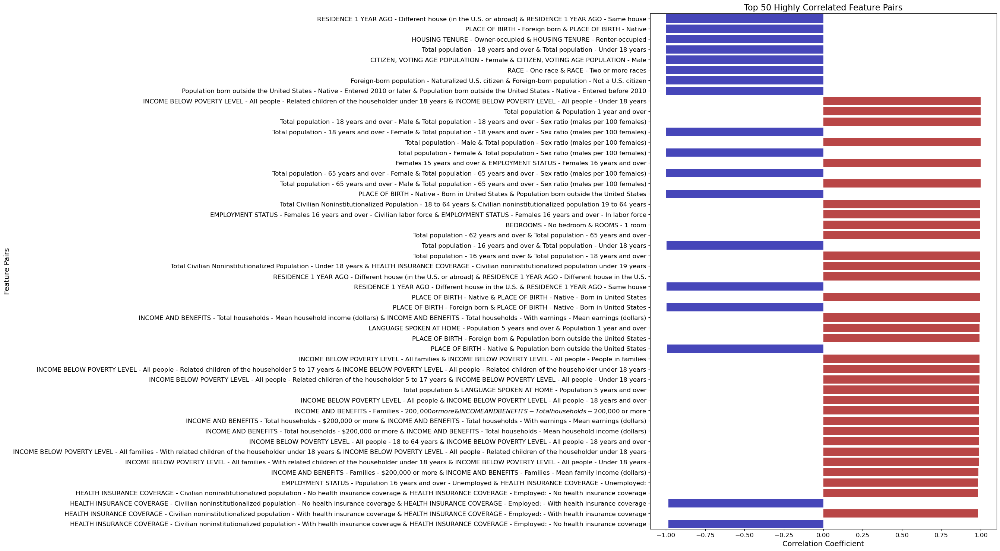

In [18]:
# After sorting by absolute correlation, take the top 50 and explicitly create a copy
top_50_corr = corr_filtered_sorted.head(50).copy()  # Adding .copy() here

# Now add the 'Feature Pair' column without triggering the warning
top_50_corr['Feature Pair'] = top_50_corr['Feature1'] + ' & ' + top_50_corr['Feature2']

# Determine the color based on the sign of the correlation coefficient
colors = ['#CC3333' if x > 0 else '#3333CC' for x in top_50_corr['Correlation']]

# Adjust figure size or scale of text elements as needed to avoid tight layout warning
plt.figure(figsize=(12, 18))  # Adjusted figure size for more space
barplot = sns.barplot(data=top_50_corr, y='Feature Pair', x='Correlation', orient='h', palette=colors)
plt.title('Top 50 Highly Correlated Feature Pairs', fontsize=16)  # Adjusted font size
plt.xlabel('Correlation Coefficient', fontsize=14)  # Adjusted font size
plt.ylabel('Feature Pairs', fontsize=14)  # Adjusted font size
plt.xticks(fontsize=12)  # Adjusted font size for x-ticks
plt.yticks(fontsize=12)  # Adjusted font size for y-ticks

# Attempt applying tight layout again with adjusted figure size and text scales
plt.tight_layout()

# Save the figure to a file
plt.savefig('top_50_correlated_pairs_colorcoded.png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()


Mention my favorite opposite pair place of birth foreign born and place of birth native born in US. Doesn't account for children of diplomats and military bases and don't know how it handles US territories.

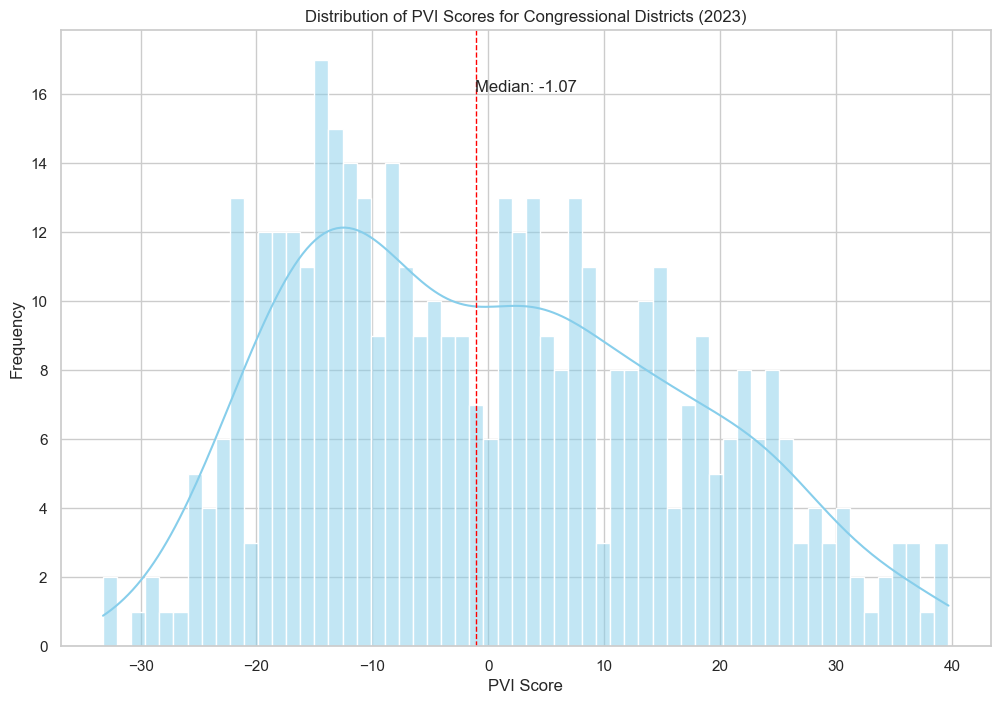

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the style of seaborn
sns.set(style='whitegrid')

# Create the histogram
plt.figure(figsize=(12, 8))
sns.histplot(pct_df['PVI_2023'], bins=60, kde=True, color='skyblue')

# Adding aesthetics
plt.title('Distribution of PVI Scores for Congressional Districts (2023)')
plt.xlabel('PVI Score')
plt.ylabel('Frequency')
plt.axvline(pct_df['PVI_2023'].median(), color='red', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(pct_df['PVI_2023'].median()*1.1, max_ylim*0.9, 'Median: {:.2f}'.format(pct_df['PVI_2023'].median()))

# Display the plot
plt.show()


In [157]:
import pandas as pd


# Define the control mapping
control_mapping = {
    # GOP Redistricting states
    'AL': 'GOP Redistricting', 'AR': 'GOP Redistricting', 'FL': 'GOP Redistricting', 'GA': 'GOP Redistricting',
    'IN': 'GOP Redistricting', 'IA': 'GOP Redistricting', 'KS': 'GOP Redistricting', 'KY': 'GOP Redistricting',
    'LA': 'GOP Redistricting', 'MS': 'GOP Redistricting', 'MO': 'GOP Redistricting', 'NE': 'GOP Redistricting',
    'OH': 'GOP Redistricting', 'OK': 'GOP Redistricting', 'SC': 'GOP Redistricting', 'TN': 'GOP Redistricting',
    'TX': 'GOP Redistricting', 'UT': 'GOP Redistricting', 'WV': 'GOP Redistricting',

    # Democratic Redistricting states
    'IL': 'Democratic Redistricting', 'MD': 'Democratic Redistricting', 'MA': 'Democratic Redistricting',
    'NM': 'Democratic Redistricting', 'NV': 'Democratic Redistricting', 'OR': 'Democratic Redistricting', 'RI': 'Democratic Redistricting',

    # Split-Party Redistricting
    'ME': 'Split-Party Redistricting',

    # Courts
    'CT': 'Courts', 'MN': 'Courts', 'NC': 'Courts', 'NH': 'Courts',
    'NY': 'Courts', 'PA': 'Courts', 'VA': 'Courts', 'WI': 'Courts',

    # Independent Commission
    'AZ': 'Independent Commission', 'CA': 'Independent Commission', 'CO': 'Independent Commission', 'MI': 'Independent Commission',

    # Political Commission
    'HI': 'Political Commission', 'ID': 'Political Commission', 'MT': 'Political Commission', 'NJ': 'Political Commission', 'WA': 'Political Commission',

    # At-Large State
    'AK': 'At-Large State', 'DE': 'At-Large State', 'ND': 'At-Large State', 'SD': 'At-Large State',
    'VT': 'At-Large State', 'WY': 'At-Large State',
}


# Function to determine control type and append district to appropriate list
def categorize_districts(district):
    state_abbr = district.split('-')[0]  # Extract the state abbreviation from the district string
    control_type = control_mapping.get(state_abbr, 'Other')  # Get the control type from the dictionary or default to 'Other'
    
    if control_type == 'GOP Redistricting':
        gop_controlled.append(district)
    elif control_type == 'Democratic Redistricting':
        democratic_controlled.append(district)
    elif control_type == 'Split-Party Redistricting':
        split_control.append(district)
    elif control_type == 'Courts':
        Courts_drawn.append(district)
    elif control_type == 'Independent Commission':
        independent_commission.append(district)
    elif control_type == 'Political Commission':
        political_commission.append(district)
    elif control_type == 'At-Large State':
        at_large_state.append(district)
    else:
        print(f"No match found for {state_abbr}")  # Print when the state abbreviation doesn't match any key in the control_mapping

# Lists to hold districts based on control type
gop_controlled = []
democratic_controlled = []
split_control = []
Courts_drawn = []
independent_commission = []
political_commission = []
at_large_state = []

# Iterate over the DataFrame and categorize each district
pct_df['Formatted_District'].apply(categorize_districts)

# Print out the counts for each list as a check
print(f'GOP Redistricting: {len(gop_controlled)} districts')
print(f'Democratic Redistricting: {len(democratic_controlled)} districts')
print(f'Split-Party Redistricting: {len(split_control)} districts')
print(f'Courts: {len(Courts_drawn)} districts')
print(f'Independent Commission: {len(independent_commission)} districts')
print(f'Political Commission: {len(political_commission)} districts')
print(f'At-Large State: {len(at_large_state)} districts')


GOP Redistricting: 177 districts
Democratic Redistricting: 49 districts
Split-Party Redistricting: 2 districts
Courts: 91 districts
Independent Commission: 82 districts
Political Commission: 28 districts
At-Large State: 6 districts


In [158]:
def assign_redistricting_type(district):
    state_abbr = district.split('-')[0]  # Extract the state abbreviation from the district string
    return control_mapping.get(state_abbr, 'Other')  # Get the control type or default to 'Other'

# Create a new column 'Redistricting Type' by applying the function to each district
pct_df['Redistricting Type'] = pct_df['Formatted_District'].apply(assign_redistricting_type)

# Now, pct_df has a new column 'Redistricting Type' with the type of redistricting for each district


/opt/homebrew/Caskroom/miniforge/base/envs/WheeleyDope/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/var/folders/h4/j84n8y_50sq08cp7wghj5_xm0000gn/T/ipykernel_6556/1615942963.py:64: UserWarning: The figure layout has changed to tight
  g.fig.tight_layout(w_pad=2)  # Adjust this padding as necessary to prevent overlap


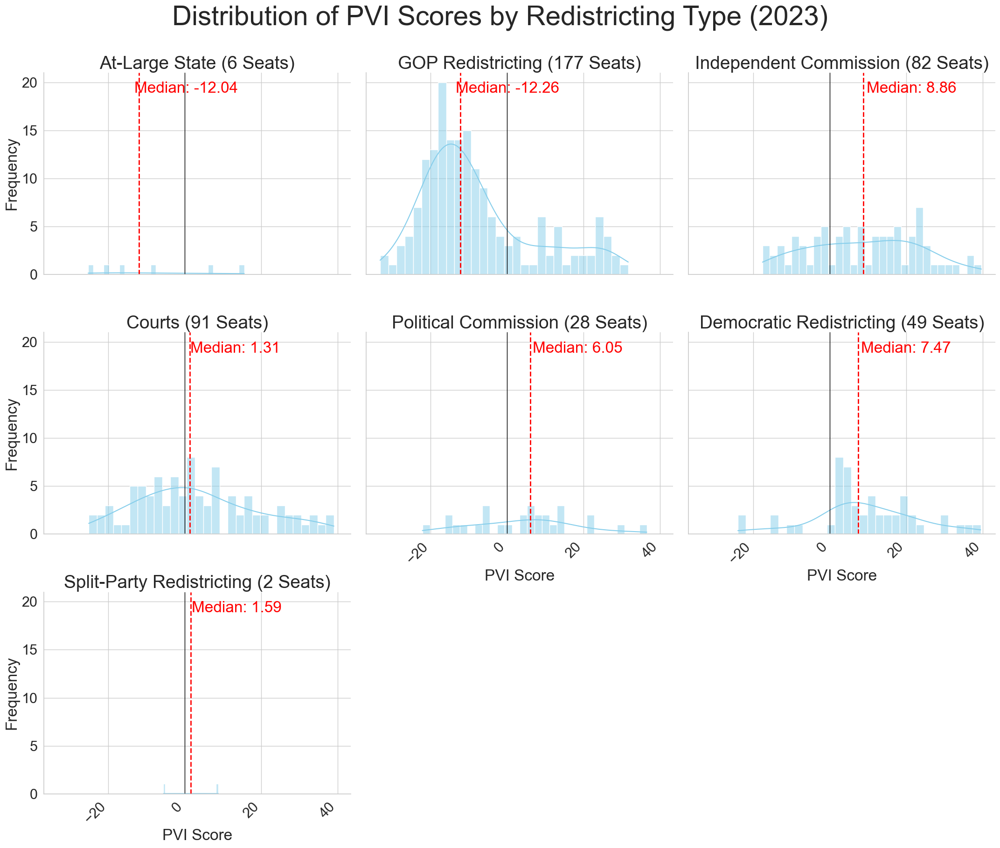

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of seaborn
sns.set(style='whitegrid')

# Dictionary to hold the seat totals for each redistricting type
seat_totals = {
    'GOP Redistricting': 177,
    'Democratic Redistricting': 49,
    'Split-Party Redistricting': 2,
    'Courts': 91,
    'Independent Commission': 82,
    'Political Commission': 28,
    'At-Large State': 6
}

# Increase the size of the plots for better visibility in presentations
g = sns.FacetGrid(pct_df, col='Redistricting Type', col_wrap=3, sharex=True, sharey=True, height=6, aspect=1.2)

# Mapping the histogram plot for each subplot
g.map(sns.histplot, 'PVI_2023', bins=30, kde=True, color='skyblue')

# Custom function to format subplot titles
def format_titles(col_val, seat_totals):
    return f'{col_val} ({seat_totals[col_val]} Seats)'

# Setting custom titles with larger font size
for ax, title in zip(g.axes.flatten(), g.col_names):
    ax.set_title(format_titles(title, seat_totals), fontsize=28)

# Customizing axis labels with larger font size
g.set_axis_labels('PVI Score', 'Frequency', fontsize=24)

# Adding a vertical line for the median PVI score in each subplot with annotations
for ax in g.axes.flatten():
    median_val = pct_df[pct_df['Redistricting Type'] == ax.get_title().split(' (')[0]]['PVI_2023'].median()
    ax.axvline(median_val, color='red', linestyle='dashed', linewidth=2)
    
    # Add zero line for y-axis
    ax.axvline(x=0, color='black', linestyle='solid', linewidth=1)
    
    min_ylim, max_ylim = ax.get_ylim()
    ax.text(median_val*1.1, max_ylim*0.9, f'Median: {median_val:.2f}', color='red', fontsize=24)

# Increasing tick label size
for ax in g.axes.flatten():
    ax.tick_params(axis='both', which='major', labelsize=22)

# Set a super title for the entire figure and adjust its position
g.fig.suptitle('Distribution of PVI Scores by Redistricting Type (2023)', fontsize=42, y=1.01)

# Rotate x-axis labels for each subplot for clarity
for ax in g.axes.flatten():
    for label in ax.get_xticklabels():
        label.set_rotation(45)  # Rotate labels to avoid overlap
        label.set_ha('right')   # Align the labels to the right for better readability

# Adjust the layout with increased bottom margin to accommodate rotated labels
plt.subplots_adjust(bottom=.2)  # Adjust this value as needed to ensure labels fit

# Instead of plt.tight_layout(), use the following to adjust subplot spacing
g.fig.subplots_adjust(bottom=0.2)  # Adjust bottom spacing to accommodate x-axis labels
g.fig.tight_layout(w_pad=2)  # Adjust this padding as necessary to prevent overlap


# Save the figure to a file with higher resolution for clarity in presentations
plt.savefig('data/Distribution_of_PVI_Scores_by_Redistricting_Type_2023_Presentation.png', dpi=300, bbox_inches='tight')

# Show plot
plt.show()

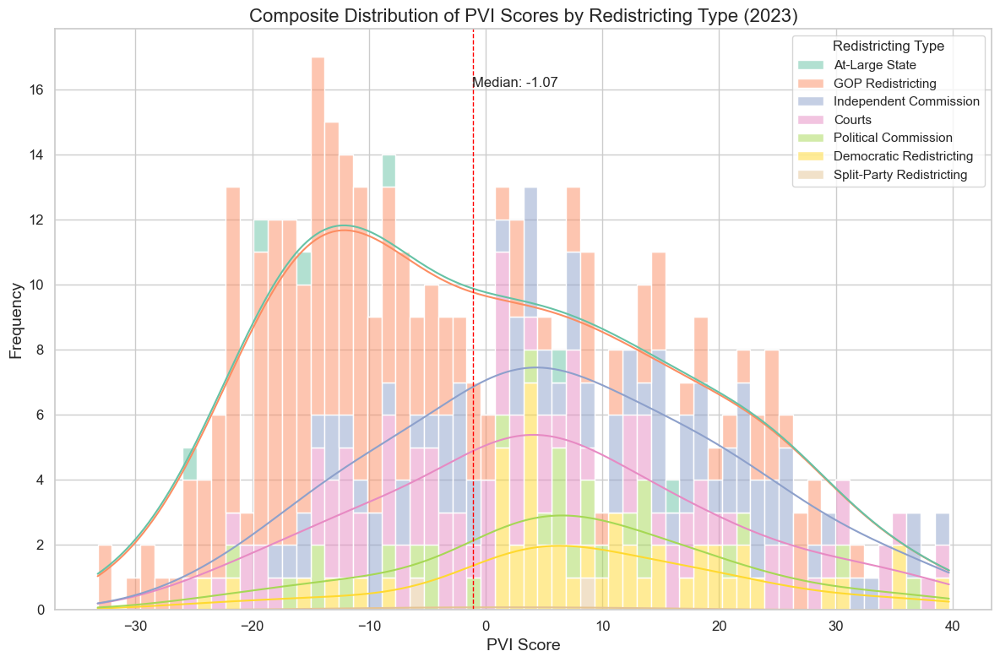

In [160]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of seaborn
sns.set(style='whitegrid')

# Create the histogram and color-code by 'Redistricting Type'
plt.figure(figsize=(12, 8))
hist = sns.histplot(data=pct_df, x='PVI_2023', bins=60, kde=True, hue='Redistricting Type', palette='Set2', multiple='stack')

# Adding aesthetics
plt.title('Composite Distribution of PVI Scores by Redistricting Type (2023)', fontsize=16)
plt.xlabel('PVI Score', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Adding a vertical line for the overall median PVI score
overall_median = pct_df['PVI_2023'].median()
plt.axvline(overall_median, color='red', linestyle='dashed', linewidth=1)
min_ylim, max_ylim = plt.ylim()
plt.text(overall_median*1.1, max_ylim*0.9, 'Median: {:.2f}'.format(overall_median), fontsize=12)

# Adjust layout
plt.tight_layout()

# Save the figure to a file
plt.savefig('Composite_PVI_Scores_Distribution_by_Redistricting_Type_2023.png', dpi=300)

# Show plot
plt.show()


In [ ]:
# Filter the majority-minority districts based on the White population percentage
majority_minority_districts = pct_df[pct_df['RACE - One race - White'] < 50]
majority_minority_districts.shape

In [ ]:
# Initialize lists for majority-minority district categorization with '_mm' suffix
gop_controlled_mm = []
democratic_controlled_mm = []
split_control_mm = []
court_drawn_mm = []
independent_commission_mm = []
political_commission_mm = []
at_large_state_mm = []

# Adjusted function to accept a suffix for list names
def categorize_districts_mm(district):
    state_abbr = district.split('-')[0]  # Extract the state abbreviation from the district string
    for control_type, states in control_mapping.items():
        if state_abbr in states:
            if control_type == 'GOP-Controlled':
                gop_controlled_mm.append(district)
            elif control_type == 'Democratic-Controlled':
                democratic_controlled_mm.append(district)
            elif control_type == 'Split Control':
                split_control_mm.append(district)
            elif control_type == 'Court':
                court_drawn_mm.append(district)
            elif control_type == 'Independent Commission':
                independent_commission_mm.append(district)
            elif control_type == 'Political Commission':
                political_commission_mm.append(district)
            elif control_type == 'At-Large State':
                at_large_state_mm.append(district)
            break

# Apply the function to majority-minority districts
majority_minority_districts['Formatted_District'].apply(categorize_districts_mm)

# Print out the counts for each list as a check
print(f'GOP-Controlled Majority-Minority: {len(gop_controlled_mm)} districts')
print(f'Democratic-Controlled Majority-Minority: {len(democratic_controlled_mm)} districts')
print(f'Split Control Majority-Minority: {len(split_control_mm)} districts')
print(f'Court Majority-Minority: {len(court_drawn_mm)} districts')
print(f'Independent Commission Majority-Minority: {len(independent_commission_mm)} districts')
print(f'Political Commission Majority-Minority: {len(political_commission_mm)} districts')
print(f'At-Large State Majority-Minority: {len(at_large_state_mm)} districts')


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a larger figure to accommodate the plot
plt.figure(figsize=(14, 10))

# Create the box plot to show the distribution of minority proportions within each control category
sns.boxplot(data=pct_df, x='Control Type', y='Minority Proportion', palette='Set3', width=0.6)

# Overlay a scatter plot to show individual district data points
# We use 'dodge' to spread out the points and avoid overlap
sns.stripplot(data=pct_df, x='Control Type', y='Minority Proportion', color='black', size=5, jitter=True, dodge=True)

# Label points with 'Formatted_District'
# This can make the plot crowded, consider labeling selectively or using interactive plotting libraries for better clarity
for i, row in pct_df.iterrows():
    plt.text(x=row['Control Type'], y=row['Minority Proportion'], s=row['Formatted_District'], horizontalalignment='center', size='small', color='gray', rotation=45)

# Set plot titles and labels
plt.title('Minority Proportion by Redistricting Control Type')
plt.xlabel('Redistricting Control Type')
plt.ylabel('Minority Proportion (%)')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability

# Display the plot
plt.tight_layout()  # Adjust subplots to fit into figure area.
plt.show()


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Extract state abbreviations from 'Formatted_District' to use as x-axis categories
pct_df['State'] = pct_df['Formatted_District'].apply(lambda x: x.split('-')[0])

# Create a larger figure to accommodate the plot
plt.figure(figsize=(20, 12))  # You might need to adjust the size based on the number of states

# Create the box plot to show the distribution of minority proportions within each state
sns.boxplot(data=pct_df, x='State', y='Minority Proportion', palette='Set3', width=0.6)

# Overlay a scatter plot to show individual district data points, color-coded by redistricting control type
# We use 'dodge' to spread out the points and avoid overlap
sns.stripplot(data=pct_df, x='State', y='Minority Proportion', hue='Control Type', jitter=True, dodge=True, linewidth=0.5, edgecolor='gray')

# Set plot titles and labels
plt.title('Minority Proportion by State, Color-Coded by Redistricting Control Type')
plt.xlabel('State')
plt.ylabel('Minority Proportion (%)')
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability

# Place the legend outside the plot
plt.legend(title='Control Type', bbox_to_anchor=(1.05, 1), loc='upper left')

# Display the plot
plt.tight_layout()  # Adjust subplots to fit into figure area.
plt.show()


In [ ]:
# Adjusted column names based on the dataset
demographic_vars = [
    'Total population - Median age (years)',  # Replace with the exact column name for median age
    'INCOME AND BENEFITS - Total households - Median household income (dollars)',  # Correct column name for median household income
    'EDUCATIONAL ATTAINMENT - Population 25 years and over - Bachelor\'s degree or higher'  # Replace with the exact column name for education level if different
]

# Calculate summary statistics for the adjusted demographic variables
summary_stats = majority_minority_districts[demographic_vars].describe()
print(summary_stats)


In [ ]:
# Analyze the political lean of majority-minority districts using PVI or election results
political_vars = ['2022 State PVI', '2020 Biden %', '2020 Trump %']
political_summary = majority_minority_districts[political_vars].describe()
print(political_summary)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Histogram of Median Household Income in Majority-Minority Districts
plt.figure(figsize=(10, 6))
sns.histplot(majority_minority_districts['Median household income'], bins=30, kde=True)
plt.title('Distribution of Median Household Income in Majority-Minority Districts')
plt.xlabel('Median Household Income')
plt.ylabel('Frequency')
plt.show()


In [ ]:
# Bar plot of PVI distribution in Majority-Minority Districts
plt.figure(figsize=(10, 6))
sns.countplot(x='2022 State PVI', data=majority_minority_districts)
plt.title('Distribution of 2022 State PVI in Majority-Minority Districts')
plt.xlabel('2022 State PVI')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Print the name of the column at index 3
print(f"Column at index 3: {pct_df.columns[3]}")

# Since Python uses 0-based indexing, the 454th column will be at index 453
print(f"Column at index 454 (0-based indexing makes it 453): {pct_df.columns[453]}")


# this is the baseline model

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Define the target variable
y = pct_df['PVI_2023']

# Define feature variables (select columns from index 3 to 453)
X = pct_df.iloc[:, 3:454]

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Calculate the mean of the target variable from the training set
y_train_mean = np.mean(y_train)

# Create an array of mean values with the same shape as y_test to serve as predictions
y_pred_baseline = np.full(shape=y_test.shape, fill_value=y_train_mean)

# Compute metrics for the baseline model
mse_baseline = mean_squared_error(y_test, y_pred_baseline)
rmse_baseline = np.sqrt(mse_baseline)
mae_baseline = mean_absolute_error(y_test, y_pred_baseline)
r2_baseline = r2_score(y_test, y_pred_baseline)

# Print out the baseline model performance metrics
print(f"Baseline Model Metrics:")
print(f"Mean Squared Error: {mse_baseline:.3f}")
print(f"Root Mean Squared Error: {rmse_baseline:.3f}")
print(f"Mean Absolute Error: {mae_baseline:.3f}")
print(f"R-squared: {r2_baseline:.3f}")


In [ ]:
Best score: 0.8341126688472466
R-squared: 0.834
Mean Squared Error: 36.002
Root Mean Squared Error: 6.000
Mean Absolute Error: 4.793
Mean Absolute Percentage Error: 197.476%

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



# Function to calculate mean absolute percentage error
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Define target variable
y = pct_df['PVI_2023']

# Define feature variables
X = pct_df.iloc[:, 3:454]

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), X.columns)])

# Append classifier to preprocessing pipeline.
clf = Pipeline(steps=[('preprocessor', preprocessor),
                      ('classifier', LassoCV())])

# Specify the hyperparameters and classifiers for the grid search
from sklearn.linear_model import RidgeCV

param_grid = [
    {'classifier': [LassoCV(max_iter=1000)],
     'classifier__cv': [3, 5, 10],
     'classifier__selection': ['random', 'cyclic']},
    {'classifier': [RidgeCV()],
     'classifier__cv': [3, 5, 10]}
]

# Initialize the grid search
grid_search = GridSearchCV(clf, param_grid, cv=5)

# Fit the grid search
grid_search.fit(X_train, y_train)

# Get the best parameters and the best score
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_}")

# Use the best estimator to make predictions on the test set
best_estimator = grid_search.best_estimator_
y_pred = best_estimator.predict(X_test)

# Compute metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)
r2_test = r2_score(y_test, y_pred)

# Compute R-squared for the training set
y_train_pred = best_estimator.predict(X_train)
r2_train = r2_score(y_train, y_train_pred)

print(f"Training R-squared: {r2_train:.3f}")
print(f"Test R-squared: {r2_test:.3f}")
print(f"Mean Squared Error: {mse:.3f}")
print(f"Root Mean Squared Error: {rmse:.3f}")
print(f"Mean Absolute Error: {mae:.3f}")
print(f"Mean Absolute Percentage Error: {mape:.3f}%")

# Get the feature importances
importances = best_estimator.named_steps['classifier'].coef_

# Map the features to their coefficients (importances)
feature_importances = pd.DataFrame({"Feature": X.columns, "Importance": importances})

# Sort by most to least important
feature_importances = feature_importances.sort_values("Importance", ascending=False)

# display the DataFrame
print(feature_importances)


In [ ]:
# Define the preprocessors (scalers)
classifiers = {
    'LinearRegression': {
        'model': LinearRegression(),
        'params': {}
    },
    'RidgeCV': {
        'model': RidgeCV(cv=5),
        'params': {}
    },
    'LassoCV': {
        'model': LassoCV(cv=5),
        'params': {
        'classifier__cv': [3, 5, 10]}
    },
    'RandomForestRegressor': {
        'model': RandomForestRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'GradientBoostingRegressor': {
        'model': GradientBoostingRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__learning_rate': [0.01, 0.1],
            'classifier__max_depth': [3, 5, 10]
        }
    },
    'SVR': {
        'model': SVR(),
        'params': {
            'classifier__C': [0.1, 1, 10],
            'classifier__epsilon': [0.1, 0.2, 0.3]
        }
    },
    'ElasticNet': {
        'model': ElasticNet(),
        'params': {
            'classifier__alpha': [0.1, 1, 10],
            'classifier__l1_ratio': [0.1, 0.5, 0.9]
        }
    },
    'DecisionTreeRegressor': {
        'model': DecisionTreeRegressor(),
        'params': {
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'KNeighborsRegressor': {
        'model': KNeighborsRegressor(),
        'params': {
            'classifier__n_neighbors': [3, 5, 7]
        }
    },
    'AdaBoostRegressor': {
        'model': AdaBoostRegressor(),
        'params': {
            'classifier__n_estimators': [50, 100],
            'classifier__learning_rate': [0.01, 0.1]
        }
    },
    'ExtraTreesRegressor': {
        'model': ExtraTreesRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    }
}


preprocessors = {
    'Standard Scaler': StandardScaler(),
    'Min Max Scaler': MinMaxScaler(),
    'No Scaler': None
}

# Iterate over each preprocessor
for preprocessor_name, preprocessor in preprocessors.items():
    
    # If there's a preprocessor, add it to the pipeline
    if preprocessor is not None:
        pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('classifier', None)])
    else:
        pipeline = Pipeline(steps=[('classifier', None)])
    
    # Iterate over each classifier
    for classifier_name, classifier in classifiers.items():
        pipeline.set_params(classifier = classifier['model'])

        # Initialize the randomized search
        random_search = RandomizedSearchCV(pipeline, classifier['params'], n_iter=10, cv=5, random_state=42)

        # Fit the randomized search
        random_search.fit(X_train, y_train)

        # Use the best estimator to make predictions on the test set
        best_estimator = random_search.best_estimator_
        y_pred = best_estimator.predict(X_test)

        # Compute metrics
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f"\n{preprocessor_name} with {classifier_name} metrics:")
        print(f"Best parameters: {random_search.best_params_}")
        print(f"Best score: {random_search.best_score_}")
        print(f"R-squared: {r2:.3f}")
        print(f"Mean Squared Error: {mse:.3f}")
        print(f"Root Mean Squared Error: {rmse:.3f}")
        print(f"Mean Absolute Error: {mae:.3f}")
        print(f"Mean Absolute Percentage Error: {mape:.3f}%")
        

# ^^^^^^^^^Here^^^^^^^^^^

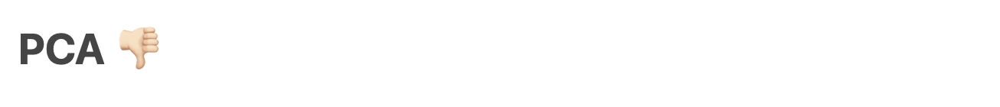

In [ ]:
from sklearn.decomposition import PCA

# instantiate
pca = PCA(n_components=0.99)

# Fit PCA on your training data and transform it
X_train_pca99 = pca.fit_transform(X_train)

# Transform the test data using the already fitted PCA object
X_test_pca99 = pca.transform(X_test)

print("Number of components chosen by PCA: ", pca.n_components_)


In [ ]:
# Define the preprocessors (scalers)
classifiers = {
    'LinearRegression': {
        'model': LinearRegression(),
        'params': {}
    },
    'RidgeCV': {
        'model': RidgeCV(cv=5),
        'params': {}
    },
    'LassoCV': {
        'model': LassoCV(cv=5),
        'params': {
        'classifier__cv': [3, 5, 10]}
    },
    'RandomForestRegressor': {
        'model': RandomForestRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'GradientBoostingRegressor': {
        'model': GradientBoostingRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__learning_rate': [0.01, 0.1],
            'classifier__max_depth': [3, 5, 10]
        }
    },
    'SVR': {
        'model': SVR(),
        'params': {
            'classifier__C': [0.1, 1, 10],
            'classifier__epsilon': [0.1, 0.2, 0.3]
        }
    },
    'ElasticNet': {
        'model': ElasticNet(),
        'params': {
            'classifier__alpha': [0.1, 1, 10],
            'classifier__l1_ratio': [0.1, 0.5, 0.9]
        }
    },
    'DecisionTreeRegressor': {
        'model': DecisionTreeRegressor(),
        'params': {
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'KNeighborsRegressor': {
        'model': KNeighborsRegressor(),
        'params': {
            'classifier__n_neighbors': [3, 5, 7]
        }
    },
    'AdaBoostRegressor': {
        'model': AdaBoostRegressor(),
        'params': {
            'classifier__n_estimators': [50, 100],
            'classifier__learning_rate': [0.01, 0.1]
        }
    },
    'ExtraTreesRegressor': {
        'model': ExtraTreesRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    }
}


preprocessors = {
    'Standard Scaler': StandardScaler(),
    'Min Max Scaler': MinMaxScaler(),
    'No Scaler': None
}

# Iterate over each preprocessor
for preprocessor_name, preprocessor in preprocessors.items():
    
    # If there's a preprocessor, add it to the pipeline
    if preprocessor is not None:
        pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('classifier', None)])
    else:
        pipeline = Pipeline(steps=[('classifier', None)])
    
    # Iterate over each classifier
    for classifier_name, classifier in classifiers.items():
        pipeline.set_params(classifier = classifier['model'])

        # Initialize the randomized search
        random_search = RandomizedSearchCV(pipeline, classifier['params'], n_iter=10, cv=5, random_state=42)

        # Fit the randomized search
        random_search.fit(X_train_pca99, y_train)

        # Use the best estimator to make predictions on the test set
        best_estimator = random_search.best_estimator_
        y_pred = best_estimator.predict(X_test_pca99)

        # Compute metrics
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f"\n{preprocessor_name} with {classifier_name} metrics:")
        print(f"Best parameters: {random_search.best_params_}")
        print(f"Best score: {random_search.best_score_}")
        print(f"R-squared: {r2:.3f}")
        print(f"Mean Squared Error: {mse:.3f}")
        print(f"Root Mean Squared Error: {rmse:.3f}")
        print(f"Mean Absolute Error: {mae:.3f}")
        print(f"Mean Absolute Percentage Error: {mape:.3f}%")
        

In [ ]:
# instantiate
pca = PCA(n_components=0.9999)

# Fit PCA on your training data and transform it
X_train_pca9999 = pca.fit_transform(X_train)

# Transform the test data using the already fitted PCA object
X_test_pca9999 = pca.transform(X_test)

print("Number of components chosen by PCA: ", pca.n_components_)


In [ ]:
for preprocessor_name, preprocessor in preprocessors.items():
    
    # If there's a preprocessor, add it to the pipeline
    if preprocessor is not None:
        pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('classifier', None)])
    else:
        pipeline = Pipeline(steps=[('classifier', None)])
    
    # Iterate over each classifier
    for classifier_name, classifier in classifiers.items():
        pipeline.set_params(classifier = classifier['model'])

        # Initialize the randomized search
        random_search = RandomizedSearchCV(pipeline, classifier['params'], n_iter=10, cv=5, random_state=42)

        # Fit the randomized search
        random_search.fit(X_train_pca9999, y_train)

        # Use the best estimator to make predictions on the test set
        best_estimator = random_search.best_estimator_
        y_pred = best_estimator.predict(X_test_pca9999)

        # Compute metrics
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f"\n{preprocessor_name} with {classifier_name} metrics:")
        print(f"Best parameters: {random_search.best_params_}")
        print(f"Best score: {random_search.best_score_}")
        print(f"R-squared: {r2:.3f}")
        print(f"Mean Squared Error: {mse:.3f}")
        print(f"Root Mean Squared Error: {rmse:.3f}")
        print(f"Mean Absolute Error: {mae:.3f}")
        print(f"Mean Absolute Percentage Error: {mape:.3f}%")

# Neural Network

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

model = Sequential()
model.add(Dense(1000, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dense(100, activation='relu'))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error')

history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=1000, batch_size=32)

train_mse = model.evaluate(X_train, y_train)
test_mse = model.evaluate(X_test, y_test)

print('Train MSE:', train_mse)
print('Test MSE:', test_mse)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print('Train RMSE:', train_rmse)
print('Test RMSE:', test_rmse)

print('Train R^2:', train_r2)
print('Test R^2:', test_r2)


In [ ]:
from tensorflow.keras.layers import Dropout
from tensorflow.keras.callbacks import EarlyStopping


model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],)))
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(1))

model.compile(optimizer='adam', loss='mean_squared_error')

history = model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=5000, batch_size=32, callbacks=[EarlyStopping(patience=300)])

train_mse = model.evaluate(X_train, y_train)
test_mse = model.evaluate(X_test, y_test)

print('Train MSE:', train_mse)
print('Test MSE:', test_mse)

y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print('Train RMSE:', train_rmse)
print('Test RMSE:', test_rmse)

print('Train R^2:', train_r2)
print('Test R^2:', test_r2)


In [ ]:
from tensorflow.keras import regularizers
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Set the L2 regularization rate
reg_rate = 0.001

# Create the model
model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(X_train_scaled.shape[1],), kernel_regularizer=regularizers.l2(reg_rate)))
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(reg_rate)))
model.add(Dropout(0.5))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Fit the model
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=500, batch_size=32, callbacks=[EarlyStopping(patience=300)])

# Evaluate the model
train_mse = model.evaluate(X_train_scaled, y_train)
test_mse = model.evaluate(X_test_scaled, y_test)


# Make predictions
y_train_pred = model.predict(X_train_scaled)
y_test_pred = model.predict(X_test_scaled)

# Compute RMSE
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

# Compute R^2 score
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train MSE:", train_mse)
print("Test MSE:", test_mse)

# Print the metrics
print('Train RMSE:', train_rmse)
print('Test RMSE:', test_rmse)
print('Train R^2:', train_r2)
print('Test R^2:', test_r2)


In [ ]:
from tensorflow.keras import regularizers
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Set the L2 regularization rate
reg_rate = 10

# Create the model
model = Sequential()
model.add(Dense(32, activation='relu', input_shape=(X_train_scaled.shape[1],), kernel_regularizer=regularizers.l2(reg_rate)))
model.add(Dropout(0.33))
model.add(Dense(32, activation='relu', kernel_regularizer=regularizers.l2(reg_rate)))
model.add(Dropout(0.33))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Fit the model
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=500, batch_size=32, callbacks=[EarlyStopping(patience=50)])

# Evaluate the model
train_mse = model.evaluate(X_train_scaled, y_train)
test_mse = model.evaluate(X_test_scaled, y_test)


# Make predictions
y_train_pred = model.predict(X_train_scaled)
y_test_pred = model.predict(X_test_scaled)

# Compute RMSE
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

# Compute R^2 score
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train MSE:", train_mse)
print("Test MSE:", test_mse)

# Print the metrics
print('Train RMSE:', train_rmse)
print('Test RMSE:', test_rmse)
print('Train R^2:', train_r2)
print('Test R^2:', test_r2)


# Working on it^^^^^

# K-Fold vvvvv

In [ ]:
from sklearn.model_selection import KFold
from tensorflow.keras import regularizers
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

X_np = X.values
y_np = y.values

# Set the L2 regularization rate
reg_rate = 10

n_splits = 15
kf = KFold(n_splits=n_splits)

mse_scores = []
r2_scores = []

for train_index, test_index in kf.split(X_np):
    X_train_full, X_test = X_np[train_index], X_np[test_index]
    y_train_full, y_test = y_np[train_index], y_np[test_index]
    
    X_train, X_val, y_train, y_val = train_test_split(X_train_full, y_train_full, test_size=0.1)
    
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)
    X_test = scaler.transform(X_test)
    
    # Create the model
    model = Sequential()
    model.add(Dense(128, activation='relu', input_shape=(X_train.shape[1],), kernel_regularizer=regularizers.l2(reg_rate)))
    model.add(Dropout(0.5))
    model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(reg_rate)))
    model.add(Dropout(0.5))
    model.add(Dense(1))

    # Compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Fit the model
    history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=500, batch_size=32, callbacks=[EarlyStopping(patience=10)], verbose=0)

    # Evaluate the model
    test_mse = model.evaluate(X_test, y_test, verbose=0)
    
    # Make predictions
    y_test_pred = model.predict(X_test)

    # Compute RMSE
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

    # Compute R^2 score
    test_r2 = r2_score(y_test, y_test_pred)

    mse_scores.append(test_mse)
    r2_scores.append(test_r2)

    print("Test MSE:", test_mse)
    print('Test RMSE:', test_rmse)
    print('Test R^2:', test_r2)

print("Average MSE:", np.mean(mse_scores))
print('Average RMSE:', np.mean([np.sqrt(mse) for mse in mse_scores]))
print('Average R^2:', np.mean(r2_scores))


In [ ]:
from tensorflow.keras import regularizers
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Set the L2 regularization rate
reg_rate = 10

# Create the model
model = Sequential()
model.add(Dense(128, activation='relu', input_shape=(X_train_scaled.shape[1],), kernel_regularizer=regularizers.l2(reg_rate)))
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu', kernel_regularizer=regularizers.l2(reg_rate)))
model.add(Dropout(0.5))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Fit the model
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=500, batch_size=32, callbacks=[EarlyStopping(patience=10)])

# Evaluate the model
train_mse = model.evaluate(X_train_scaled, y_train)
test_mse = model.evaluate(X_test_scaled, y_test)


# Make predictions
y_train_pred = model.predict(X_train_scaled)
y_test_pred = model.predict(X_test_scaled)

# Compute RMSE
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

# Compute R^2 score
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train MSE:", train_mse)
print("Test MSE:", test_mse)

# Print the metrics
print('Train RMSE:', train_rmse)
print('Test RMSE:', test_rmse)
print('Train R^2:', train_r2)
print('Test R^2:', test_r2)


# P Good^^^^^

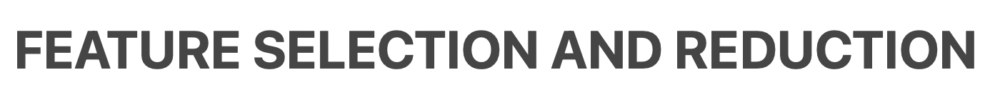

In [ ]:
pct_df = pd.read_csv('data/Full_Dataset_PCT.csv')

In [ ]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error

# Define target variable
y = pct_df['PVI_2023']

# Define feature variables
X = pct_df.iloc[:, 3:454]

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

# Fit the scaler on the training data
scaler.fit(X_train)

# Transform the training and test data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize LassoCV
lasso = LassoCV(cv=5)

# Fit the model
lasso.fit(X_train_scaled, y_train)

# Predict on the training and test data
y_train_pred = lasso.predict(X_train_scaled)
y_test_pred = lasso.predict(X_test_scaled)


# Compute metrics
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = lasso.score(X_train_scaled, y_train)
test_r2 = lasso.score(X_test_scaled, y_test)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
train_mape = mean_absolute_percentage_error(y_train, y_train_pred)
test_mape = mean_absolute_percentage_error(y_test, y_test_pred)

print(f"Best alpha : {lasso.alpha_}")
print(f"R-squared, Train: {train_r2}, Test: {test_r2}")
print(f"R-squared, Test: {test_r2}")
print(f"Mean Squared Error, Train: {train_mse}, Test: {test_mse}")
print(f"Root Mean Squared Error, Train: {train_rmse}, Test: {test_rmse}")
print(f"Mean Absolute Error, Train: {train_mae}, Test: {test_mae}")
print(f"Mean Absolute Percentage Error, Train: {train_mape}, Test: {test_mape}")

for f in range(X_train.shape[1]):
    print(f"{f + 1}. feature {X_train.columns[indices[f]]} ({importances[indices[f]]})")

    # Get the feature names
feature_names = X.columns

# Get the feature importances (the coefficients of the features in the Lasso model)
importances = lasso.coef_

# Sort the features by importance
indices = np.argsort(importances)[::-1]

print("Feature ranking:")

for f in range(X_train.shape[1]):
    print(f"{f + 1}. feature {X_train.columns[indices[f]]} ({importances[indices[f]]})")



# Select the top 15 positive features
positive_features = [(feature_names[i], importances[i]) for i in indices if importances[i] > 0][:15]

# Select the top 15 negative features
negative_features = [(feature_names[i], importances[i]) for i in indices if importances[i] < 0][-15:]

# Combine the positive and negative features
primary_features = positive_features + negative_features

# Get the primary feature column names
primary_columns = [feature for feature, importance in primary_features]

# Print the primary feature column names
print("\nPrimary feature column names:")
for column in primary_columns:
    print(column)


# Print the primary features
print("\nPrimary features:")
for feature, importance in primary_features:
    print(f"Feature: {feature}, Importance: {importance}")




In [ ]:
primary_features

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the context for "poster"
sns.set_context("poster")

# Sort the features by their absolute importance and take top 15 positive and negative
top_pos = sorted(positive_features, key=lambda x: x[1], reverse=True)[:15]
top_neg = sorted(negative_features, key=lambda x: abs(x[1]), reverse=True)[:15]

# Create subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 15))

# Create a bar plot for positive features
sns.barplot(x=[x[1] for x in top_pos], y=[x[0] for x in top_pos], ax=axs[0])
axs[0].set_title("Top 15 Positive Features")

# Create a bar plot for negative features
sns.barplot(x=[x[1] for x in top_neg], y=[x[0] for x in top_neg], ax=axs[1])
axs[1].set_title("Top 15 Negative Features")

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
pct_df = pd.read_csv('data/Full_Dataset_PCT.csv')

In [ ]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error

# Define target variable
y = pct_df['PVI_2023']

# Define feature variables
X = pct_df.iloc[:, 3:454]
X = X.drop(columns=primary_columns)

# Split the data into training and test sets
X_train2, X_test2, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

# Fit the scaler on the training data
scaler.fit(X_train2)

# Transform the training and test data
X_train2_scaled = scaler.transform(X_train2)
X_test2_scaled = scaler.transform(X_test2)

# Initialize LassoCV
lasso = LassoCV(cv=5, max_iter=10000)

# Fit the model
lasso.fit(X_train2_scaled, y_train)

# Get the feature names
feature_names = X.columns

# Get the feature importances (the coefficients of the features in the Lasso model)
importances = lasso.coef_

# Sort the features by importance
indices = np.argsort(importances)[::-1]


# Predict on the training and test data
y_train_pred = lasso.predict(X_train2_scaled)
y_test_pred = lasso.predict(X_test2_scaled)

# Compute metrics
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = lasso.score(X_train2_scaled, y_train)
test_r2 = lasso.score(X_test2_scaled, y_test)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
train_mape = mean_absolute_percentage_error(y_train, y_train_pred)
test_mape = mean_absolute_percentage_error(y_test, y_test_pred)

print(f"Best alpha : {lasso.alpha_}")
print(f"R-squared, Train: {train_r2}, Test: {test_r2}")
print(f"R-squared, Test: {test_r2}")
print(f"Mean Squared Error, Train: {train_mse}, Test: {test_mse}")
print(f"Root Mean Squared Error, Train: {train_rmse}, Test: {test_rmse}")
print(f"Mean Absolute Error, Train: {train_mae}, Test: {test_mae}")
print(f"Mean Absolute Percentage Error, Train: {train_mape}, Test: {test_mape}")

# Select the top 15 positive features
positive_features = [(feature_names[i], importances[i]) for i in indices if importances[i] > 0][:15]

# Select the top 15 negative features
negative_features = [(feature_names[i], importances[i]) for i in indices if importances[i] < 0][-15:]

# Combine the positive and negative features
secondary_features = positive_features + negative_features

# Get the primary feature column names
secondary_columns = [feature for feature, importance in secondary_features]

# Print the primary feature column names
print("\nSecondary feature column names:")
for column in secondary_columns:
    print(column)

# Print the secondary features
print("\nSecondary features:")
for feature, importance in secondary_features:
    print(f"Feature: {feature}, Importance: {importance}")
    
print("Feature ranking:")
for f in range(X_train2.shape[1]):
    print(f"{f + 1}. feature {X_train2.columns[indices[f]]} ({importances[indices[f]]})")


In [ ]:
secondary_features

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the context for "poster"
sns.set_context("poster")

# Sort the features by their absolute importance and take top 15 positive and negative
top_pos = sorted(positive_features, key=lambda x: x[1], reverse=True)[:15]
top_neg = sorted(negative_features, key=lambda x: abs(x[1]), reverse=True)[:15]

# Create subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 15))

# Create a bar plot for positive features
sns.barplot(x=[x[1] for x in top_pos], y=[x[0] for x in top_pos], ax=axs[0])
axs[0].set_title("Top 15 Positive Features - Secondary")

# Create a bar plot for negative features
sns.barplot(x=[x[1] for x in top_neg], y=[x[0] for x in top_neg], ax=axs[1])
axs[1].set_title("Top 15 Negative Features - Secondary")

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
pct_df = pd.read_csv('data/Full_Dataset_PCT.csv')

In [ ]:
from sklearn.linear_model import LassoCV
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error

# Combine primary and secondary column lists
primary_and_secondary_columns = primary_columns + secondary_columns


# Define target variable
y = pct_df['PVI_2023']

# Define feature variables
X = pct_df.iloc[:, 3:454]
X = X.drop(columns=primary_and_secondary_columns)

# Split the data into training and test sets
X_train3, X_test3, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

# Fit the scaler on the training data
scaler.fit(X_train3)

# Transform the training and test data
X_train3_scaled = scaler.transform(X_train3)
X_test3_scaled = scaler.transform(X_test3)

# Initialize LassoCV
lasso = LassoCV(cv=5, max_iter=10000)

# Fit the model
lasso.fit(X_train3_scaled, y_train)

# Get the feature names
feature_names = X.columns

# Get the feature importances (the coefficients of the features in the Lasso model)
importances = lasso.coef_

# Sort the features by importance
indices = np.argsort(importances)[::-1]


# Predict on the training and test data
y_train_pred = lasso.predict(X_train3_scaled)
y_test_pred = lasso.predict(X_test3_scaled)

# Compute metrics
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = lasso.score(X_train3_scaled, y_train)
test_r2 = lasso.score(X_test3_scaled, y_test)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
train_mape = mean_absolute_percentage_error(y_train, y_train_pred)
test_mape = mean_absolute_percentage_error(y_test, y_test_pred)

print(f"Best alpha : {lasso.alpha_}")
print(f"R-squared, Train: {train_r2}, Test: {test_r2}")
print(f"R-squared, Test: {test_r2}")
print(f"Mean Squared Error, Train: {train_mse}, Test: {test_mse}")
print(f"Root Mean Squared Error, Train: {train_rmse}, Test: {test_rmse}")
print(f"Mean Absolute Error, Train: {train_mae}, Test: {test_mae}")
print(f"Mean Absolute Percentage Error, Train: {train_mape}, Test: {test_mape}")

# Select the top 15 positive features
positive_features = [(feature_names[i], importances[i]) for i in indices if importances[i] > 0][:15]

# Select the top 15 negative features
negative_features = [(feature_names[i], importances[i]) for i in indices if importances[i] < 0][-15:]

# Combine the positive and negative features
tertiary_features = positive_features + negative_features

# Get the primary feature column names
tertiary_columns = [feature for feature, importance in tertiary_features]

# Print the primary feature column names
print("\ntertiary feature column names:")
for column in tertiary_columns:
    print(column)

# Print the tertiary features
print("\ntertiary features:")
for feature, importance in tertiary_features:
    print(f"Feature: {feature}, Importance: {importance}")
    
print("Feature ranking:")
for f in range(X_train3.shape[1]):
    print(f"{f + 1}. feature {X_train3.columns[indices[f]]} ({importances[indices[f]]})")


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the context for "poster"
sns.set_context("poster")

# Sort the features by their absolute importance and take top 15 positive and negative
top_pos = sorted(positive_features, key=lambda x: x[1], reverse=True)[:15]
top_neg = sorted(negative_features, key=lambda x: abs(x[1]), reverse=True)[:15]

# Create subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 15))

# Create a bar plot for positive features
sns.barplot(x=[x[1] for x in top_pos], y=[x[0] for x in top_pos], ax=axs[0])
axs[0].set_title("Top 15 Positive Features - Tertiary")

# Create a bar plot for negative features
sns.barplot(x=[x[1] for x in top_neg], y=[x[0] for x in top_neg], ax=axs[1])
axs[1].set_title("Top 15 Negative Features - Tertiary")

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
important_columns = primary_and_secondary_columns + tertiary_columns

In [ ]:
pct_df = pd.read_csv('data/Full_Dataset_PCT.csv')
prf_df = pd.read_csv('data/Full_Dataset_PRF.csv')

In [ ]:
# Define target variable
y = pct_df['PVI_2023']

# Define feature variables
X = pct_df[primary_columns]

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the preprocessors (scalers)
classifiers = {
    'LinearRegression': {
        'model': LinearRegression(),
        'params': {}
    },
    'RidgeCV': {
        'model': RidgeCV(cv=5),
        'params': {}
    },
    'LassoCV': {
        'model': LassoCV(cv=5),
        'params': {
        'classifier__cv': [3, 5, 10]}
    },
    'RandomForestRegressor': {
        'model': RandomForestRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'GradientBoostingRegressor': {
        'model': GradientBoostingRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__learning_rate': [0.01, 0.1],
            'classifier__max_depth': [3, 5, 10]
        }
    },
    'SVR': {
        'model': SVR(),
        'params': {
            'classifier__C': [0.1, 1, 10],
            'classifier__epsilon': [0.1, 0.2, 0.3]
        }
    },
    'ElasticNet': {
        'model': ElasticNet(),
        'params': {
            'classifier__alpha': [0.1, 1, 10],
            'classifier__l1_ratio': [0.1, 0.5, 0.9]
        }
    },
    'DecisionTreeRegressor': {
        'model': DecisionTreeRegressor(),
        'params': {
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'KNeighborsRegressor': {
        'model': KNeighborsRegressor(),
        'params': {
            'classifier__n_neighbors': [3, 5, 7]
        }
    },
    'AdaBoostRegressor': {
        'model': AdaBoostRegressor(),
        'params': {
            'classifier__n_estimators': [50, 100],
            'classifier__learning_rate': [0.01, 0.1]
        }
    },
    'ExtraTreesRegressor': {
        'model': ExtraTreesRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    }
}


preprocessors = {
    'Standard Scaler': StandardScaler(),
    'Min Max Scaler': MinMaxScaler(),
    'No Scaler': None
}

# Iterate over each preprocessor
for preprocessor_name, preprocessor in preprocessors.items():
    
    # If there's a preprocessor, add it to the pipeline
    if preprocessor is not None:
        pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('classifier', None)])
    else:
        pipeline = Pipeline(steps=[('classifier', None)])
    
    # Iterate over each classifier
    for classifier_name, classifier in classifiers.items():
        pipeline.set_params(classifier = classifier['model'])

        # Initialize the randomized search
        random_search = RandomizedSearchCV(pipeline, classifier['params'], n_iter=10, cv=5, random_state=42)

        # Fit the randomized search
        random_search.fit(X_train, y_train)

        # Use the best estimator to make predictions on the test set
        best_estimator = random_search.best_estimator_
        y_pred = best_estimator.predict(X_test)

        # Compute metrics
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f"\n{preprocessor_name} with {classifier_name} metrics:")
        print(f"Best parameters: {random_search.best_params_}")
        print(f"Best score: {random_search.best_score_}")
        print(f"R-squared: {r2:.3f}")
        print(f"Mean Squared Error: {mse:.3f}")
        print(f"Root Mean Squared Error: {rmse:.3f}")
        print(f"Mean Absolute Error: {mae:.3f}")
        print(f"Mean Absolute Percentage Error: {mape:.3f}%")
        

In [ ]:

from sklearn.preprocessing import StandardScaler
# Define target variable
y = pct_df['PVI_2023']

# Define feature variables
X = pct_df[important_columns]

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler and transform the training data
X_train_scaled = scaler.fit_transform(X_train)

# Transform the testing data
X_test_scaled = scaler.transform(X_test)


# Define the model
model = XGBRegressor()

# Define the grid of hyperparameters
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 10]
}

# Initialize the grid search
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='r2')

# Fit the grid search
grid_search.fit(X_train_scaled, y_train)

# Get the best model
best_model = grid_search.best_estimator_

# Make predictions
y_pred = best_model.predict(X_test_scaled)

# Compute metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

print(f"\nMetrics for XGBoostRegressor with grid search:")
print(f"Best parameters: {grid_search.best_params_}")
print(f"Best score: {grid_search.best_score_}")
print(f"R-squared: {r2:.3f}")
print(f"Mean Squared Error: {mse:.3f}")
print(f"Root Mean Squared Error: {rmse:.3f}")
print(f"Mean Absolute Error: {mae:.3f}")
print(f"Mean Absolute Percentage Error: {mape:.3f}%")


In [ ]:
from tensorflow.keras import regularizers
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score

# Scale the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Set the L2 regularization rate
reg_rate = 10

# Create the model
model = Sequential()
model.add(Dense(64, activation='relu', input_shape=(X_train_scaled.shape[1],), kernel_regularizer=regularizers.l2(reg_rate)))
model.add(Dropout(0.5))
model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(reg_rate)))
model.add(Dropout(0.5))
model.add(Dense(256, activation='relu', kernel_regularizer=regularizers.l2(reg_rate)))
model.add(Dropout(0.5))
model.add(Dense(1))

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Fit the model
history = model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=500, batch_size=32, callbacks=[EarlyStopping(patience=100)])

# Evaluate the model
train_mse = model.evaluate(X_train_scaled, y_train)
test_mse = model.evaluate(X_test_scaled, y_test)


# Make predictions
y_train_pred = model.predict(X_train_scaled)
y_test_pred = model.predict(X_test_scaled)

# Compute RMSE
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

# Compute R^2 score
train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print("Train MSE:", train_mse)
print("Test MSE:", test_mse)

# Print the metrics
print('Train RMSE:', train_rmse)
print('Test RMSE:', test_rmse)
print('Train R^2:', train_r2)
print('Test R^2:', test_r2)


# Best Feature Subset Selection - gave up takes way too long

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from itertools import combinations
import numpy as np
from tqdm import tqdm

# Get the number of features p
p = X.shape[1]

# Define the feature sizes to consider
feature_sizes = [30]  # For example, if you want to consider models with 30 features

# Initialize an empty dictionary to store the results
results = {}

# Loop over the feature sizes
for k in tqdm(feature_sizes, desc='Feature sizes'):
    # Initialize an empty list to store the MSEs for each model of size k
    mse_list = []
    
    # Loop over all combinations of p features taken k at a time
    for combo in combinations(range(p), k):
        # Select the features
        X_subset = X.iloc[:, list(combo)]
        
        # Split the data into training and test sets
        X_train, X_test, y_train, y_test = train_test_split(X_subset, y, test_size=0.2, random_state=42)
        
        # Fit the model
        model = LinearRegression()
        model.fit(X_train, y_train)
        
        # Predict on the test set
        y_pred = model.predict(X_test)
        
        # Compute the MSE and add it to the list
        mse = mean_squared_error(y_test, y_pred)
        mse_list.append(mse)
    
    # Store the MSEs in the dictionary
    results[k] = mse_list

# Compute the average MSE for each feature size
avg_mse = {k: np.mean(v) for k, v in results.items()}

# Find the feature size with the smallest average MSE
best_k = min(avg_mse, key=avg_mse.get)

print(f"The best feature size is {best_k} with an average MSE of {avg_mse[best_k]}")


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from itertools import combinations
import numpy as np
from tqdm import tqdm

# Get the number of features p
p = X.shape[1]

# Define the feature sizes to consider
feature_sizes = [30]  # For example, if you want to consider models with 30 features

# Initialize an empty dictionary to store the results
results = {}

# Loop over the feature sizes
for k in tqdm(feature_sizes, desc='Feature sizes'):
    # Initialize an empty list to store the MSEs for each model of size k
    mse_list = []
    
    # Loop over all combinations of p features taken k at a time
    for combo in combinations(range(p), k):
        # Select the features
        X_subset = X.iloc[:, list(combo)]
        
        # Split the data into training and test sets
        X_train, X_test, y_train, y_test = train_test_split(X_subset, y, test_size=0.2, random_state=42)
        
        # Fit the model
        model = LinearRegression()
        model.fit(X_train, y_train)
        
        # Predict on the test set
        y_pred = model.predict(X_test)
        
        # Compute the MSE and add it to the list
        mse = mean_squared_error(y_test, y_pred)
        mse_list.append(mse)
    
    # Store the MSEs in the dictionary
    results[k] = mse_list

# Compute the average MSE for each feature size
avg_mse = {k: np.mean(v) for k, v in results.items()}

# Find the feature size with the smallest average MSE
best_k = min(avg_mse, key=avg_mse.get)

print(f"The best feature size is {best_k} with an average MSE of {avg_mse[best_k]}")


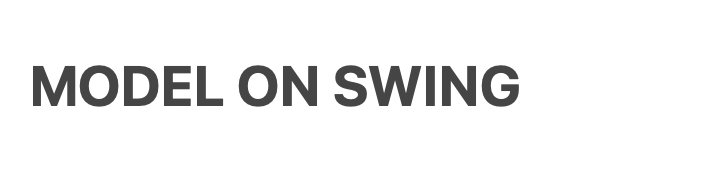

In [ ]:
pct_df = pd.read_csv('data/Full_Dataset_PCT.csv')
pct_df = pct_df[pct_df["Swing from 2020 presidential"].abs() <= 22] #ran unopposed
pct_df["Percent of 2020 turnout"] = pct_df["Percent of 2020 turnout"].str.rstrip('%').astype('float')
# Define target variable
y = pct_df['Swing from 2020 presidential']

# Define feature variables
X = pct_df[important_columns]  # Make a copy to avoid SettingWithCopyWarning
X["Percent of 2020 turnout"] = pct_df["Percent of 2020 turnout"]

X['PVI_2023'] = pct_df['PVI_2023']   # just in case we wanna use it

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [ ]:
X.shape

In [ ]:
# Define the preprocessors (scalers)
classifiers = {
    'LinearRegression': {
        'model': LinearRegression(),
        'params': {}
    },
    'RidgeCV': {
        'model': RidgeCV(cv=5),
        'params': {}
    },
    'LassoCV': {
        'model': LassoCV(cv=5, max_iter=10000),
        'params': {
        'classifier__cv': [3, 5, 10]}
    },
    'RandomForestRegressor': {
        'model': RandomForestRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'GradientBoostingRegressor': {
        'model': GradientBoostingRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__learning_rate': [0.01, 0.1],
            'classifier__max_depth': [3, 5, 10]
        }
    },
    'SVR': {
        'model': SVR(),
        'params': {
            'classifier__C': [0.1, 1, 10],
            'classifier__epsilon': [0.1, 0.2, 0.3]
        }
    },
    'ElasticNet': {
        'model': ElasticNet(),
        'params': {
            'classifier__alpha': [0.1, 1, 10],
            'classifier__l1_ratio': [0.1, 0.5, 0.9]
        }
    },
    'DecisionTreeRegressor': {
        'model': DecisionTreeRegressor(),
        'params': {
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'KNeighborsRegressor': {
        'model': KNeighborsRegressor(),
        'params': {
            'classifier__n_neighbors': [3, 5, 7]
        }
    },
    'AdaBoostRegressor': {
        'model': AdaBoostRegressor(),
        'params': {
            'classifier__n_estimators': [50, 100],
            'classifier__learning_rate': [0.01, 0.1]
        }
    },
    'ExtraTreesRegressor': {
        'model': ExtraTreesRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    }
}


preprocessors = {
    'Standard Scaler': StandardScaler(),
    'Min Max Scaler': MinMaxScaler(),
    'No Scaler': None
}

# Iterate over each preprocessor
for preprocessor_name, preprocessor in preprocessors.items():
    
    # If there's a preprocessor, add it to the pipeline
    if preprocessor is not None:
        pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('classifier', None)])
    else:
        pipeline = Pipeline(steps=[('classifier', None)])
    
    # Iterate over each classifier
    for classifier_name, classifier in classifiers.items():
        pipeline.set_params(classifier = classifier['model'])

        # Initialize the randomized search
        random_search = RandomizedSearchCV(pipeline, classifier['params'], n_iter=10, cv=5, random_state=42)

        # Fit the randomized search
        random_search.fit(X_train, y_train)

        # Use the best estimator to make predictions on the test set
        best_estimator = random_search.best_estimator_
        y_pred = best_estimator.predict(X_test)

        # Compute metrics
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f"\n{preprocessor_name} with {classifier_name} metrics:")
        print(f"Best parameters: {random_search.best_params_}")
        print(f"Best score: {random_search.best_score_}")
        print(f"R-squared: {r2:.3f}")
        print(f"Mean Squared Error: {mse:.3f}")
        print(f"Root Mean Squared Error: {rmse:.3f}")
        print(f"Mean Absolute Error: {mae:.3f}")
        print(f"Mean Absolute Percentage Error: {mape:.3f}%")
        

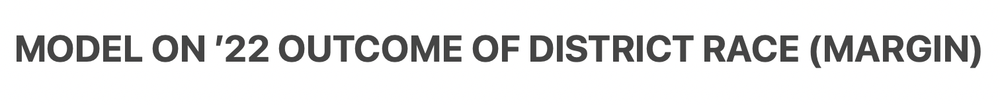

In [ ]:
pct_df = pd.read_csv('data/Full_Dataset_PCT.csv')
pct_df = pct_df[pct_df["Swing from 2020 presidential"].abs() <= 22] #ran unopposed
pct_df["Percent of 2020 turnout"] = pct_df["Percent of 2020 turnout"].str.rstrip('%').astype('float')
# Define target variable
y = pct_df['2022 Margin']

# Define feature variables
X = pct_df.iloc[:,3:454].copy()  # Make a copy to avoid SettingWithCopyWarning
X["Percent of 2020 turnout"] = pct_df["Percent of 2020 turnout"]

X['PVI_2023'] = pct_df['PVI_2023']   # just in case we wanna use it

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [ ]:
# Define the preprocessors (scalers)
classifiers = {
    'LinearRegression': {
        'model': LinearRegression(),
        'params': {}
    },
    'RidgeCV': {
        'model': RidgeCV(cv=5),
        'params': {}
    },
    'LassoCV': {
        'model': LassoCV(cv=5, max_iter=10000),
        'params': {
        'classifier__cv': [3, 5, 10]}
    },
    'RandomForestRegressor': {
        'model': RandomForestRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'GradientBoostingRegressor': {
        'model': GradientBoostingRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__learning_rate': [0.01, 0.1],
            'classifier__max_depth': [3, 5, 10]
        }
    },
    'SVR': {
        'model': SVR(),
        'params': {
            'classifier__C': [0.1, 1, 10],
            'classifier__epsilon': [0.1, 0.2, 0.3]
        }
    },
    'ElasticNet': {
        'model': ElasticNet(),
        'params': {
            'classifier__alpha': [0.1, 1, 10],
            'classifier__l1_ratio': [0.1, 0.5, 0.9]
        }
    },
    'DecisionTreeRegressor': {
        'model': DecisionTreeRegressor(),
        'params': {
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'KNeighborsRegressor': {
        'model': KNeighborsRegressor(),
        'params': {
            'classifier__n_neighbors': [3, 5, 7]
        }
    },
    'AdaBoostRegressor': {
        'model': AdaBoostRegressor(),
        'params': {
            'classifier__n_estimators': [50, 100],
            'classifier__learning_rate': [0.01, 0.1]
        }
    },
    'ExtraTreesRegressor': {
        'model': ExtraTreesRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    }
}


preprocessors = {
    'Standard Scaler': StandardScaler(),
    'Min Max Scaler': MinMaxScaler(),
    'No Scaler': None
}

# Iterate over each preprocessor
for preprocessor_name, preprocessor in preprocessors.items():
    
    # If there's a preprocessor, add it to the pipeline
    if preprocessor is not None:
        pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('classifier', None)])
    else:
        pipeline = Pipeline(steps=[('classifier', None)])
    
    # Iterate over each classifier
    for classifier_name, classifier in classifiers.items():
        pipeline.set_params(classifier = classifier['model'])

        # Initialize the randomized search
        random_search = RandomizedSearchCV(pipeline, classifier['params'], n_iter=10, cv=5, random_state=42)

        # Fit the randomized search
        random_search.fit(X_train, y_train)

        # Use the best estimator to make predictions on the test set
        best_estimator = random_search.best_estimator_
        y_pred = best_estimator.predict(X_test)

        # Compute metrics
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f"\n{preprocessor_name} with {classifier_name} metrics:")
        print(f"Best parameters: {random_search.best_params_}")
        print(f"Best score: {random_search.best_score_}")
        print(f"R-squared: {r2:.3f}")
        print(f"Mean Squared Error: {mse:.3f}")
        print(f"Root Mean Squared Error: {rmse:.3f}")
        print(f"Mean Absolute Error: {mae:.3f}")
        print(f"Mean Absolute Percentage Error: {mape:.3f}%")
        

In [ ]:
pct_df = pd.read_csv('data/Full_Dataset_PCT.csv')
pct_df = pct_df[pct_df["Swing from 2020 presidential"].abs() <= 22] #ran unopposed
pct_df["Percent of 2020 turnout"] = pct_df["Percent of 2020 turnout"].str.rstrip('%').astype('float')
# Define target variable
y = pct_df['2022 Margin']

# Define feature variables
X = pct_df[primary_columns].copy()  # Make a copy to avoid SettingWithCopyWarning
X["Percent of 2020 turnout"] = pct_df["Percent of 2020 turnout"]

X['PVI_2023'] = pct_df['PVI_2023']   # just in case we wanna use it

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [ ]:
# Define the preprocessors (scalers)
classifiers = {
    'LinearRegression': {
        'model': LinearRegression(),
        'params': {}
    },
    'RidgeCV': {
        'model': RidgeCV(cv=5),
        'params': {}
    },
    'LassoCV': {
        'model': LassoCV(cv=5, max_iter=10000),
        'params': {
        'classifier__cv': [3, 5, 10]}
    },
    'RandomForestRegressor': {
        'model': RandomForestRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'GradientBoostingRegressor': {
        'model': GradientBoostingRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__learning_rate': [0.01, 0.1],
            'classifier__max_depth': [3, 5, 10]
        }
    },
    'SVR': {
        'model': SVR(),
        'params': {
            'classifier__C': [0.1, 1, 10],
            'classifier__epsilon': [0.1, 0.2, 0.3]
        }
    },
    'ElasticNet': {
        'model': ElasticNet(),
        'params': {
            'classifier__alpha': [0.1, 1, 10],
            'classifier__l1_ratio': [0.1, 0.5, 0.9]
        }
    },
    'DecisionTreeRegressor': {
        'model': DecisionTreeRegressor(),
        'params': {
            'classifier__max_depth': [None, 5, 10]
        }
    },
    'KNeighborsRegressor': {
        'model': KNeighborsRegressor(),
        'params': {
            'classifier__n_neighbors': [3, 5, 7]
        }
    },
    'AdaBoostRegressor': {
        'model': AdaBoostRegressor(),
        'params': {
            'classifier__n_estimators': [50, 100],
            'classifier__learning_rate': [0.01, 0.1]
        }
    },
    'ExtraTreesRegressor': {
        'model': ExtraTreesRegressor(),
        'params': {
            'classifier__n_estimators': [100, 200],
            'classifier__max_depth': [None, 5, 10]
        }
    }
}


preprocessors = {
    'Standard Scaler': StandardScaler(),
    'Min Max Scaler': MinMaxScaler(),
    'No Scaler': None
}

# Iterate over each preprocessor
for preprocessor_name, preprocessor in preprocessors.items():
    
    # If there's a preprocessor, add it to the pipeline
    if preprocessor is not None:
        pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                   ('classifier', None)])
    else:
        pipeline = Pipeline(steps=[('classifier', None)])
    
    # Iterate over each classifier
    for classifier_name, classifier in classifiers.items():
        pipeline.set_params(classifier = classifier['model'])

        # Initialize the randomized search
        random_search = RandomizedSearchCV(pipeline, classifier['params'], n_iter=10, cv=5, random_state=10)

        # Fit the randomized search
        random_search.fit(X_train, y_train)

        # Use the best estimator to make predictions on the test set
        best_estimator = random_search.best_estimator_
        y_pred = best_estimator.predict(X_test)

        # Compute metrics
        mse = mean_squared_error(y_test, y_pred)
        rmse = np.sqrt(mse)
        mae = mean_absolute_error(y_test, y_pred)
        mape = mean_absolute_percentage_error(y_test, y_pred)
        r2 = r2_score(y_test, y_pred)

        print(f"\n{preprocessor_name} with {classifier_name} metrics:")
        print(f"Best parameters: {random_search.best_params_}")
        print(f"Best score: {random_search.best_score_}")
        print(f"R-squared: {r2:.3f}")
        print(f"Mean Squared Error: {mse:.3f}")
        print(f"Root Mean Squared Error: {rmse:.3f}")
        print(f"Mean Absolute Error: {mae:.3f}")
        print(f"Mean Absolute Percentage Error: {mape:.3f}%")
        

In [ ]:
primary_columns

In [ ]:
secondary_columns

In [ ]:
pct_df = pd.read_csv('data/Full_Dataset_PCT.csv')
pct_df = pct_df[pct_df["Swing from 2020 presidential"].abs() <= 22] #ran unopposed
pct_df["Percent of 2020 turnout"] = pct_df["Percent of 2020 turnout"].str.rstrip('%').astype('float')
# Define target variable
y = pct_df['2022 Margin']

# Define feature variables
X = pct_df.iloc[:,3:454].copy()  # Make a copy to avoid SettingWithCopyWarning
X["Percent of 2020 turnout"] = pct_df["Percent of 2020 turnout"]

# X['PVI_2023'] = pct_df['PVI_2023']   # just in case we wanna use it

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

# Fit the scaler on the training data
scaler.fit(X_train)

# Transform the training and test data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize LassoCV
lasso = LassoCV(cv=5, max_iter=10000)

# Fit the model
lasso.fit(X_train_scaled, y_train)

# Predict on the training and test data
y_train_pred = lasso.predict(X_train_scaled)
y_test_pred = lasso.predict(X_test_scaled)


# Compute metrics
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = lasso.score(X_train_scaled, y_train)
test_r2 = lasso.score(X_test_scaled, y_test)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
train_mape = mean_absolute_percentage_error(y_train, y_train_pred)
test_mape = mean_absolute_percentage_error(y_test, y_test_pred)

print(f"Best alpha : {lasso.alpha_}")
print(f"R-squared, Train: {train_r2}, Test: {test_r2}")
print(f"R-squared, Test: {test_r2}")
print(f"Mean Squared Error, Train: {train_mse}, Test: {test_mse}")
print(f"Root Mean Squared Error, Train: {train_rmse}, Test: {test_rmse}")
print(f"Mean Absolute Error, Train: {train_mae}, Test: {test_mae}")
print(f"Mean Absolute Percentage Error, Train: {train_mape}, Test: {test_mape}")

# Get the feature names
feature_names = X.columns

# Get the feature importances (the coefficients of the features in the Lasso model)
importances = lasso.coef_

# Sort the features by importance
indices = np.argsort(importances)[::-1]

print("Feature ranking:")

for f in range(X_train.shape[1]):
    print(f"{f + 1}. feature {X_train.columns[indices[f]]} ({importances[indices[f]]})")

# Select the top 15 positive features
positive_features = [(feature_names[i], importances[i]) for i in indices if importances[i] > 0][:30]

# Select the top 15 negative features
negative_features = [(feature_names[i], importances[i]) for i in indices if importances[i] < 0][-30:]

# Combine the positive and negative features
primary_margin_features = positive_features + negative_features

# Get the primary feature column names
primary_margin_columns = [feature for feature, importance in primary_margin_features]

# Print the primary feature column names
print("\nPrimary feature column names:")
for column in primary_margin_columns:
    print(column)

# Print the primary features
print("\nPrimary features:")
for feature, importance in primary_margin_features:
    print(f"Feature: {feature}, Importance: {importance}")


In [ ]:
primary_margin_features

In [ ]:
sns.set_context("poster")

# Sort the features by their absolute importance and take top 15 positive and negative
top_pos = sorted(positive_features, key=lambda x: x[1], reverse=True)[:5]
top_neg = sorted(negative_features, key=lambda x: abs(x[1]), reverse=True)[:5]

# Create subplots
fig, axs = plt.subplots(2, 1, figsize=(10, 15))

# Create a bar plot for positive features
sns.barplot(x=[x[1] for x in top_pos], y=[x[0] for x in top_pos], ax=axs[0])
axs[0].set_title("Top 15 Positive Features")

# Create a bar plot for negative features
sns.barplot(x=[x[1] for x in top_neg], y=[x[0] for x in top_neg], ax=axs[1])
axs[1].set_title("Top 15 Negative Features")

# Show the plot
plt.tight_layout()
plt.show()


In [ ]:
pct_df = pd.read_csv('data/Full_Dataset_PCT.csv')
pct_df = pct_df[pct_df["Swing from 2020 presidential"].abs() <= 22] #ran unopposed
pct_df["Percent of 2020 turnout"] = pct_df["Percent of 2020 turnout"].str.rstrip('%').astype('float')
# Define target variable
y = pct_df['2022 Margin']

# Define feature variables
X = pct_df.iloc[:,3:454].copy()  # Make a copy to avoid SettingWithCopyWarning
X["Percent of 2020 turnout"] = pct_df["Percent of 2020 turnout"]

# X['PVI_2023'] = pct_df['PVI_2023']   # just in case we wanna use it

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()

# Fit the scaler on the training data
scaler.fit(X_train)

# Transform the training and test data
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize LassoCV
lasso = LassoCV(cv=5, max_iter=10000)

# Fit the model
lasso.fit(X_train_scaled, y_train)

# Predict on the training and test data
y_train_pred = lasso.predict(X_train_scaled)
y_test_pred = lasso.predict(X_test_scaled)


# Compute metrics
train_mse = mean_squared_error(y_train, y_train_pred)
test_mse = mean_squared_error(y_test, y_test_pred)
train_rmse = np.sqrt(train_mse)
test_rmse = np.sqrt(test_mse)
train_r2 = lasso.score(X_train_scaled, y_train)
test_r2 = lasso.score(X_test_scaled, y_test)
train_mae = mean_absolute_error(y_train, y_train_pred)
test_mae = mean_absolute_error(y_test, y_test_pred)
train_mape = mean_absolute_percentage_error(y_train, y_train_pred)
test_mape = mean_absolute_percentage_error(y_test, y_test_pred)

print(f"Best alpha : {lasso.alpha_}")
print(f"R-squared, Train: {train_r2}, Test: {test_r2}")
print(f"R-squared, Test: {test_r2}")
print(f"Mean Squared Error, Train: {train_mse}, Test: {test_mse}")
print(f"Root Mean Squared Error, Train: {train_rmse}, Test: {test_rmse}")
print(f"Mean Absolute Error, Train: {train_mae}, Test: {test_mae}")
print(f"Mean Absolute Percentage Error, Train: {train_mape}, Test: {test_mape}")

# Get the feature names
feature_names = X.columns

# Get the feature importances (the coefficients of the features in the Lasso model)
importances = lasso.coef_

# Sort the features by importance
indices = np.argsort(importances)[::-1]

print("Feature ranking:")

for f in range(X_train.shape[1]):
    print(f"{f + 1}. feature {X_train.columns[indices[f]]} ({importances[indices[f]]})")

# Select the top 15 positive features
positive_features = [(feature_names[i], importances[i]) for i in indices if importances[i] > 0][:30]

# Select the top 15 negative features
negative_features = [(feature_names[i], importances[i]) for i in indices if importances[i] < 0][-30:]

# Combine the positive and negative features
primary_margin_features = positive_features + negative_features

# Get the primary feature column names
primary_margin_columns = [feature for feature, importance in primary_margin_features]

# Print the primary feature column names
print("\nPrimary feature column names:")
for column in primary_margin_columns:
    print(column)

# Print the primary features
print("\nPrimary features:")
for feature, importance in primary_margin_features:
    print(f"Feature: {feature}, Importance: {importance}")


In [ ]:
primary_margin_features

In [ ]:
pct_df['PVI_2023']

In [ ]:
import statsmodels.api as sm

# Add a constant (intercept term) to the features
X_train_sm = sm.add_constant(X_train)
X_test_sm = sm.add_constant(X_test)

# Fit an OLS model
ols_model = sm.OLS(y_train, X_train_sm)

# Fit the data
results = ols_model.fit()

# Get the R-squared score on the test set
y_pred_ols = results.predict(X_test_sm)
r2_ols = r2_score(y_test, y_pred_ols)

r2_ols


In [ ]:
results.summary()

# Lasso Regression

In [ ]:
# Initialize a StandardScaler
scaler = StandardScaler()

# Fit the scaler to the training data and transform the training data
X_train_scaled = scaler.fit_transform(X_train)

# Transform the test data using the scaler fitted to the training data
X_test_scaled = scaler.transform(X_test)

# Initialize a LassoCV model
lasso_model_scaled = LassoCV(cv=5)

# Fit the model on the scaled training data
lasso_model_scaled.fit(X_train_scaled, y_train)

# Make predictions on the scaled test data
y_pred_lasso_scaled = lasso_model_scaled.predict(X_test_scaled)

# Compute the R-squared score of the model
r2_lasso_scaled = r2_score(y_test, y_pred_lasso_scaled)

# Map the features to their coefficients (importances) in the scaled model
feature_importances_scaled = pd.DataFrame({"Feature": X.columns, "Importance": lasso_model_scaled.coef_})

# Sort the DataFrame by importance
feature_importances_scaled = feature_importances_scaled.sort_values("Importance", ascending=False)

r2_lasso_scaled, feature_importances_scaled


In [ ]:
# Map the features to their coefficients (importances)
feature_importances = pd.DataFrame({"Feature": X.columns, "Importance": lasso.coef_})

# Sort by most to least important
feature_importances = feature_importances.sort_values("Importance", ascending=False)

# display the DataFrame
feature_importances

In [ ]:
feature_importances.value_counts()

In [ ]:
# Count the number of coefficients that were shrunk to zero
num_zero_coefs = (lasso_model_scaled.coef_ == 0).sum()

num_zero_coefs

In [ ]:
import matplotlib.pyplot as plt

# Create a DataFrame of non-zero coefficients
non_zero_coefs = feature_importances_scaled[feature_importances_scaled["Importance"] != 0]

# Get the top 10 positive and top 10 negative coefficient features
top_pos = non_zero_coefs.sort_values("Importance", ascending=False).head(10)
top_neg = non_zero_coefs.sort_values("Importance").head(10)

# Combine the top positive and negative features
top_features = pd.concat([top_pos, top_neg])

# Create a bar plot of the feature importances
plt.figure(figsize=(12, 10))
plt.barh(top_features["Feature"], top_features["Importance"], color='skyblue')
plt.xlabel("Coefficient", fontsize=24)
plt.ylabel("Feature", fontsize=18)
plt.title("Top 10 Positive and Negative Coefficient Features", fontsize=24)
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.gca().invert_yaxis()
plt.show()




In [ ]:
# Print the list of all non-zero features
non_zero_features = non_zero_coefs["Feature"].tolist()
non_zero_features

In [ ]:
# Scaling the feature set again
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Converting to DataFrame
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)

# Using the non-zero features from the Lasso regression to build a new OLS model
X_lasso = X_scaled[non_zero_features]

# Resetting the index of y
y_reset = y.reset_index(drop=True)


X_lasso = sm.add_constant(X_lasso)
ols_lasso = sm.OLS(y_reset, X_lasso)

ols_lasso_results = ols_lasso.fit()
ols_lasso_results.summary()





In [ ]:
# Convert non-zero features and their coefficients to a DataFrame
non_zero_df = pd.DataFrame({'Feature': non_zero_features, 'Coefficient': lasso_model_scaled.coef_[lasso_model_scaled.coef_ != 0]})
non_zero_df

In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error

# Function to calculate mean absolute percentage error
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

# Calculate the metrics for the Lasso model
mse = mean_squared_error(y_test, y_pred_lasso_scaled)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_lasso_scaled)
mape = mean_absolute_percentage_error(y_test, y_pred_lasso_scaled)

mse, rmse, mae, mape


In [ ]:
# Get the average of the non-zero coefficient features in their non-scaled form
avg_non_zero_features = X[non_zero_features].mean()
avg_non_zero_features


In [ ]:
# Set 'Formatted_District' as the index
prf_df.set_index('Formatted_District', inplace=True)

# Define target variable
target = prf_df['PVI_2023']

# Define feature variables
features = prf_df.iloc[:, 3:454]
features = features.drop('Representative', axis=1) #congressperson name

# Let's display the first few rows of the features and target
features.head(), target.head()


In [ ]:
# Rename target and features to y and X
y = target
X = features

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize a Linear Regression model
model = LinearRegression()

# Fit the model on the training data
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Compute the R-squared score of the model
r2 = r2_score(y_test, y_pred)
r2

In [ ]:
import statsmodels.api as sm

# Add a constant (intercept term) to the features
X_train_sm = sm.add_constant(X_train)
X_test_sm = sm.add_constant(X_test)

# Fit an OLS model
ols_model = sm.OLS(y_train, X_train_sm)

# Fit the data
results = ols_model.fit()

# Get the R-squared score on the test set
y_pred_ols = results.predict(X_test_sm)
r2_ols = r2_score(y_test, y_pred_ols)

r2_ols
